In [4]:
import numpy as np
from datascience import *
import pandas as pd
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
from sklearn import *
from sklearn.model_selection import train_test_split
from datetime import datetime, timezone
import missingno as msno
import seaborn as sns
import math
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats
import plotly.express as px


In [5]:
calorieData = pd.read_csv("Aggregated Calories.csv")
calorieDataRevised = pd.read_csv("Aggregated Calories Revised.csv")
healthyLevel = [1, 1, 1, 1, 1, 1]
calorieData

,Participant #,prtn,phase,VR1 Selections,energy density,Calories,weight in grams,fat grams,carb grams,prot grams,Healthiness rating,Taste rating
0,820,B,Med,SKA_BeverageLiquid_Water_93%,0.00,0.00,0.0000,0.000000,0.000000,0.000000,50.0,50.0
1,820,B,Med,SM_FD_Breadstick_001,3.12,30.64,95.5968,3.220264,13.993288,2.506352,-19.0,-7.0
2,820,B,Med,SM_FD_Chicken_Cajun_Prtn_004,1.73,42.16,72.9368,1.901416,0.000000,4.599656,-37.0,35.0
3,820,B,Med,SM_FD_Chicken_Cajun_Prtn_004,1.73,42.16,72.9368,1.901416,0.000000,4.599656,-37.0,35.0
4,820,B,Med,SM_FD_Cookies_ChocChip_01,4.87,48.57,236.5359,12.968190,30.171684,2.268219,-36.0,42.0
...,...,...,...,...,...,...,...,...,...,...,...,...
412,1058,D,Med,SM_FD_Cookies_ChocChip_01,4.87,48.57,236.5359,12.968190,30.171684,2.268219,NaN,NaN
413,1058,D,Med,SM_FD_Rice_Brown_Prtn_006,1.23,73.37,90.2451,0.711689,18.768046,2.010338,NaN,NaN
414,1058,D,Med,SM_FD_Strawberry,0.32,24.51,7.8432,0.073530,1.882368,0.164217,NaN,NaN
415,1058,D,Med,SM_FD_Strawberry,0.32,24.51,7.8432,0.073530,1.882368,0.164217,NaN,NaN


In [6]:
calorieDataMinimal = calorieData[['Participant #', 'prtn', 'phase']].copy()
calorieDataMinimal = calorieDataMinimal.drop_duplicates().reset_index().drop('index', axis=1)
calorieDataMinimal

,Participant #,prtn,phase
0,820,B,Med
1,820,B,Large
2,820,D,Med
3,877,B,Med
4,877,B,Large
5,877,D,Med
6,937,B,Med
7,937,B,Large
8,937,D,Med
9,793,B,Med


Food counts: Fruit        56
Vegetable    42
Meat         39
Liquid       37
Dessert      34
Rice         23
Fries        16
Pizza        16
Bread        15
Pasta        12
Sauce        11
Soup          9
Gravy         1
Name: Food Type, dtype: int64


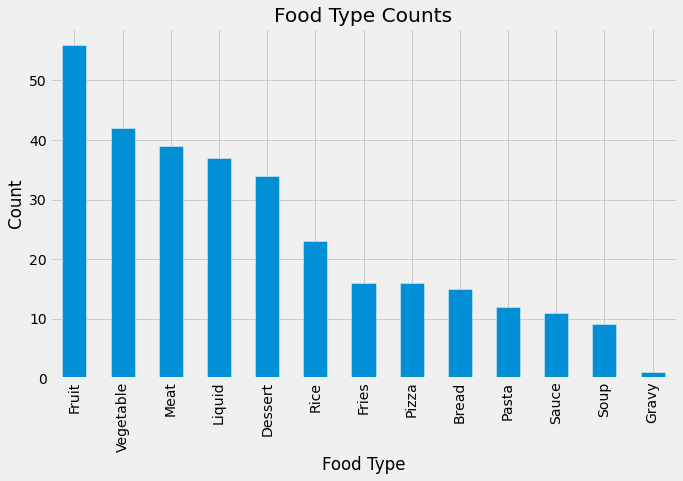

In [7]:
calorieDataRevised

food_counts = calorieDataRevised['Food Type'].value_counts()
print("Food counts:", food_counts)

plt.figure(figsize=(10, 6))  # Adjust the figure size as per your preference
food_counts.plot(kind='bar', stacked=True)

# Customize the plot
plt.title('Food Type Counts')
plt.xlabel('Food Type')
plt.ylabel('Count')

# Display the plot
plt.show()

In [8]:
unique_combinations = calorieDataRevised[['Participant #', 'prtn', 'phase']].drop_duplicates()

dataframes_list = []

for _, combination in unique_combinations.iterrows():
    filtered_df = calorieDataRevised[(calorieDataRevised['Participant #'] == combination['Participant #']) &
                     (calorieDataRevised['prtn'] == combination['prtn']) &
                     (calorieDataRevised['phase'] == combination['phase'])].copy()
    
    dataframes_list.append(filtered_df)

# for df in dataframes_list:
#     print(calorieDataRevised)
#     print('-----------------------')
dataframes_list[3]


,Participant #,prtn,phase,VR1 Selections,energy density,Calories,weight in grams,fat grams,carb grams,prot grams,Food Type
31,877,B,Med,SK_Soup_Tomato_Anim_50%,0.36,159.47,57.4092,0.175417,13.395480,1.610647,Soup
32,877,B,Med,SKA_BeverageLiquid_Water,0.00,0.00,0.0000,0.000000,0.000000,0.000000,Liquid
33,877,B,Med,SM_FD_Chicken_Cajun_Prtn_004,1.73,42.16,72.9368,1.901416,0.000000,4.599656,Meat
34,877,B,Med,SM_FD_ChocolatePudding_Prtn_004,1.29,20.39,26.3031,0.693260,4.347148,0.689182,Dessert
35,877,B,Med,SM_FD_Fries_SweetPotato_Prtn_003,1.67,40.04,66.8668,3.479476,8.584576,0.660660,Fries
36,877,B,Med,SM_FD_GreenBeans_Prtn_004,0.53,65.60,34.7680,1.974560,4.231200,0.997120,Vegetable
37,877,B,Med,SM_FD_Rice_Fried_Prtn_006,1.62,84.56,136.9872,4.041968,15.559040,3.526152,Rice
38,877,B,Med,SM_FD_Strawberry,0.32,24.51,7.8432,0.073530,1.882368,0.164217,Fruit


In [9]:
# pcaReadyData.columns

In [10]:
def evalFood(row):
    result = [0, 0, 0, 0, 0, 0]
    #energy density, Calories,weight in grams,fat grams,carb grams,prot grams
    foodStats = [row['energy density'], row['Calories'], row['weight in grams'], row['fat grams'], row['carb grams'], row['prot grams']]
    if (foodStats[0] == 0):
        return result
    
    totalGrams = foodStats[2]
    result = foodStats
    foodStats[3] = foodStats[3]/totalGrams
    foodStats[4] = foodStats[4]/totalGrams
    foodStats[5] = foodStats[5]/totalGrams

    
# for i in range(len(foodStats)):
#         if(foodStats[i] > healthyLevel[i]):
#             result[0] = 0
            
#     if(healthy):
#         result = "net healthy, "
#     else:
#         result = "net unhealthy, "
#     for i in density:
#         result = result + i + ", "
#     for i in lacking:
#         result = result + i + ", "
#     return result[:-2]

    return result
        

In [11]:
z = evalFood(calorieDataRevised.iloc[11])
print(calorieDataRevised.iloc[11])
z

Participant #                           820
prtn                                      B
phase                                 Large
VR1 Selections     SKA_BeverageLiquid_Water
energy density                          0.0
Calories                                0.0
weight in grams                         0.0
fat grams                               0.0
carb grams                              0.0
prot grams                              0.0
Food Type                            Liquid
Name: 11, dtype: object


[0, 0, 0, 0, 0, 0]

In [12]:
def evalPerson(df, metric):
    values = [0, 0, 0, 0, 0, 0]
    
    for i in range(len(df)):
        tempFood = evalFood(df.iloc[i])

        if(metric == "Calories"):
            metricVal = tempFood[1]
        if(metric == "Total Grams"):
            metricVal = tempFood[0]
        if(metric == "Energy Density"):
            metricVal = tempFood[0]
        values[0] += tempFood[0]
        values[1] += tempFood[1]
        values[2] += tempFood[2]
        values[3] += tempFood[3] * metricVal
        values[4] += tempFood[4] * metricVal
        values[5] += tempFood[5] * metricVal
        
    
    
#     result = ""

#     if(healthy):
#         result = "net healthy, "
#     else:
#         result = "net unhealthy, "
#     for i in density:
#         result = result + i + ", "
#     for i in lacking:
#         result = result + i + ", "
    return values

In [13]:
def produceVals(metric, value):
    result = [[], []]
    for i in range(len(dataframes_list)):
        temp = evalPerson(dataframes_list[i], metric)
        result[1].append(temp[value])
        if(metric == "Calories"):
            result[0].append(temp[1])
        if(metric == "Total Grams"):
            result[0].append(temp[2])
        if(metric == "Energy Density"):
            result[0].append(temp[0])
    return result

In [14]:
z = evalPerson(dataframes_list[1], 'Calories')
z

[13.069999999999999,
 544.75999999999999,
 739.92570000000012,
 16.158429936015647,
 77.66665998571824,
 15.968427086876904]

In [15]:
dataframes_list[1]

,Participant #,prtn,phase,VR1 Selections,energy density,Calories,weight in grams,fat grams,carb grams,prot grams,Food Type
11,820,B,Large,SKA_BeverageLiquid_Water,0.00,0.00,0.0000,0.000000,0.000000,0.000000,Liquid
12,820,B,Large,SM_FD_Chicken_Cajun_Prtn_005,1.73,87.60,151.5480,3.950760,0.000000,9.557160,Meat
13,820,B,Large,SM_FD_Cookies_ChocChip_01,4.87,48.57,236.5359,12.968190,30.171684,2.268219,Dessert
14,820,B,Large,SM_FD_Grapes_02,0.69,8.17,5.6373,0.013072,1.478770,0.058824,Fruit
15,820,B,Large,SM_FD_Gravy_Prtn_005,0.35,45.54,15.9390,0.496386,2.500146,0.355212,Gravy
16,820,B,Large,SM_FD_GreenBeans_Prtn_005,0.53,93.33,49.4649,2.809233,6.019785,1.418616,Vegetable
17,820,B,Large,SM_FD_Pasta_White_Prtn_005,1.58,38.22,60.3876,0.355446,11.794692,2.216760,Pasta
18,820,B,Large,SM_FD_Potatoes_Mashed_Prtn_005,1.15,43.19,49.6685,1.883084,7.679182,0.777420,Vegetable
19,820,B,Large,SM_FD_Rice_Brown_Prtn_007,1.23,108.87,133.9101,1.056039,27.848946,2.983038,Rice
20,820,B,Large,SM_FD_Sauce_Marinara_Prtn_005,0.62,46.76,28.9912,0.944552,5.059432,0.734132,Sauce


In [16]:

def makeGraph(x, y, valType):
    y_label = y
    thing = [[],[]]
    if y == 'Fat':
        y = 3
    elif y == 'Carbs':
        y = 4
    elif y == 'Protein':
        y = 5
    
    thing = produceVals(x, y)
    
    x_values = thing[0]
    y_values = thing[1]
    
    colors = ['red', 'red', 'red', 'green', 'green', 'green', 'blue', 'blue', 'blue', 'cyan', 'cyan', 'cyan',
              'magenta', 'magenta', 'magenta', 'yellow', 'yellow', 'yellow', 'orange', 'orange', 'orange',
              'purple', 'purple', 'purple', 'brown', 'brown', 'brown', 'pink', 'pink', 'pink', 'teal', 'teal', 'teal',
              'lime', 'lime', 'lime', 'gray', 'gray', 'gray']
    
    participant_list = ['820', '820', '820', '877', '877', '877', '937', '937', '937', '793', '793', '793',
                        '942', '942', '942', '961', '961', '961', '963', '963', '963', '984', '984', '984',
                        '962', '962', '962', '946', '946', '946', '966', '966', '966', '1056', '1056', '1056',
                        '1058', '1058', '1058']
    
    if(valType == 'Phase'):
        colors = ['blue' if (i+1) % 3 != 0 else 'red' for i in range(len(colors))]
        participant_list = ['B' if (i+1) % 3 != 0 else 'D' for i in range(len(participant_list))]
    if(valType == "Prtn"):
        colors = ['magenta' if (i+1) % 3 != 2 else 'green' for i in range(len(colors))]
        participant_list = ['med' if (i+1) % 2 != 0 else 'Large' for i in range(len(participant_list))]

    
    # Create a unique color map for participants
    color_map = {}
    for participant, color in zip(participant_list, colors):
        if participant not in color_map:
            color_map[participant] = color
    
    unique_colors = [color_map[participant] for participant in participant_list]

    # Create a larger figure
    plt.figure(figsize=(10, 6))

    # Create a scatter plot
    plt.scatter(x_values, y_values, c=unique_colors)

    # Create a legend
    handles = []
    labels = []
    for participant in participant_list:
        if participant not in labels:
            handles.append(plt.Line2D([], [], marker='o', color=color_map[participant], markersize=10))
            labels.append(participant)
    plt.legend(handles, labels, title='Participant #', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)

    # Add labels and title
    plt.xlabel(x)
    plt.ylabel(y_label + " as evaluated by " + x)
    plt.title(x + " vs "+ y_label)

    if(valType == 'Phase'):
        plt.legend(handles, labels, title='Protocol', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)
    if(valType == 'Prtn'):
        plt.legend(handles, labels, title='prtn', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)
    # Show the plot
    plt.show()

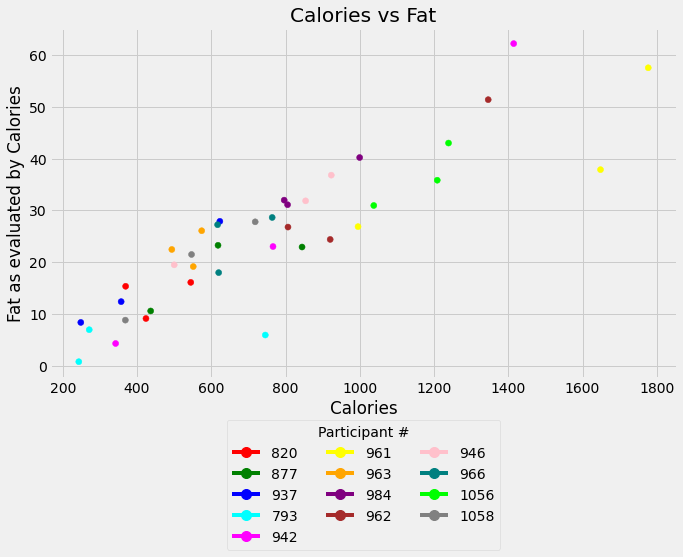

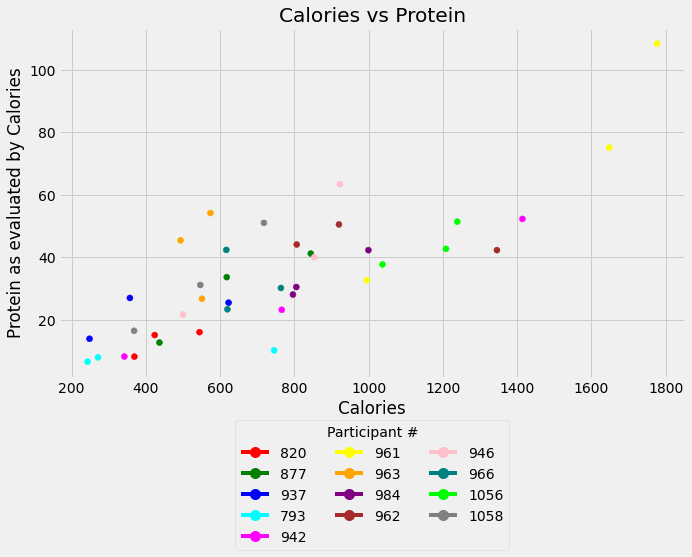

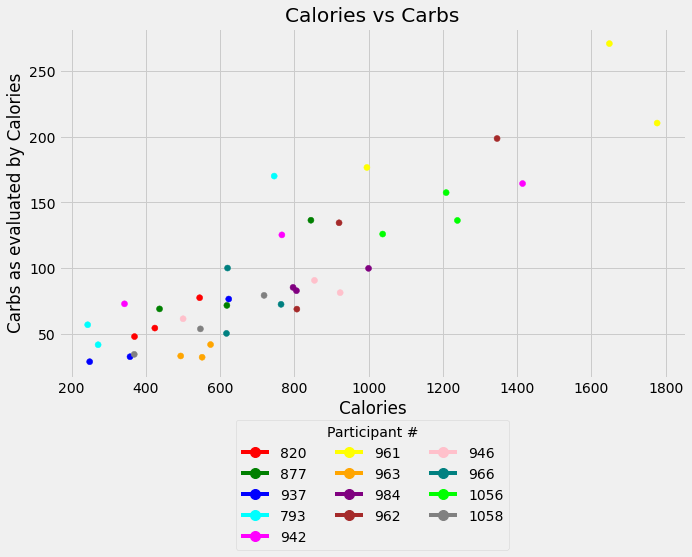

In [17]:
makeGraph("Calories", "Fat", "NA")
makeGraph("Calories", "Protein", "NA")
makeGraph("Calories", "Carbs", "NA")

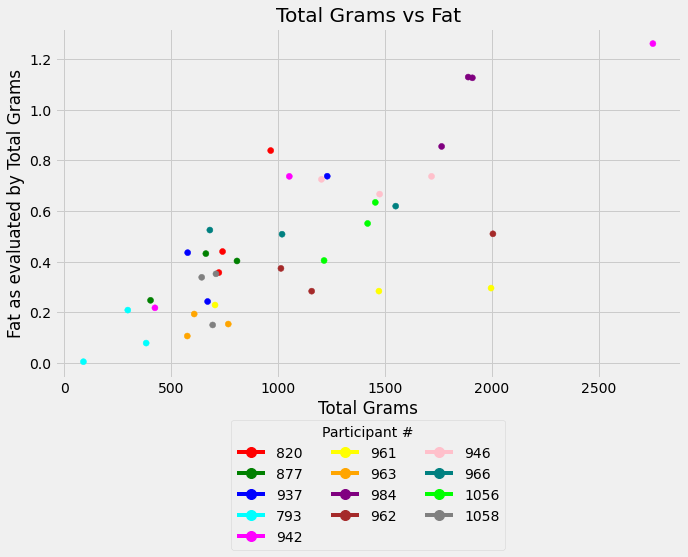

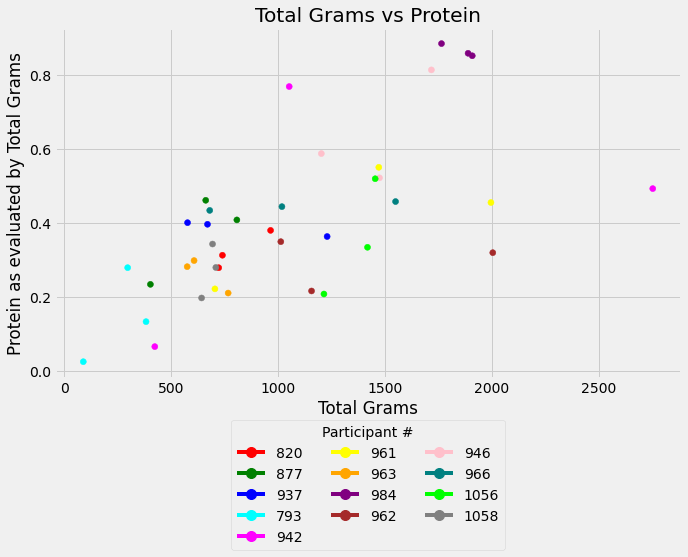

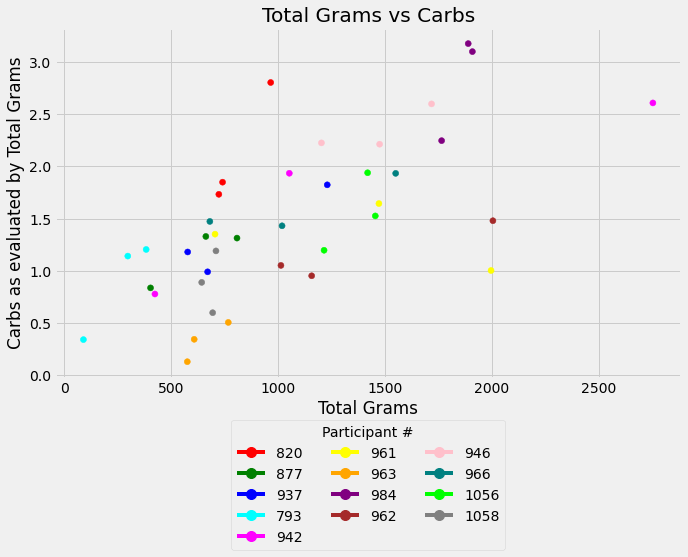

In [18]:
makeGraph("Total Grams", "Fat", "NA")
makeGraph("Total Grams", "Protein", "NA")
makeGraph("Total Grams", "Carbs", "NA")

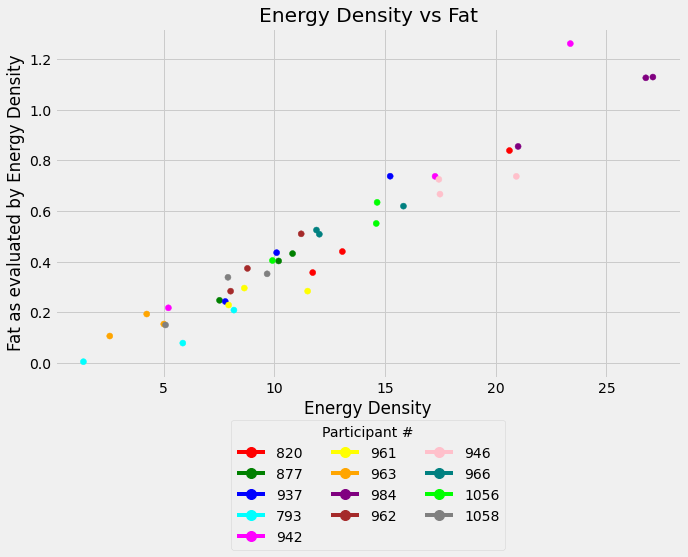

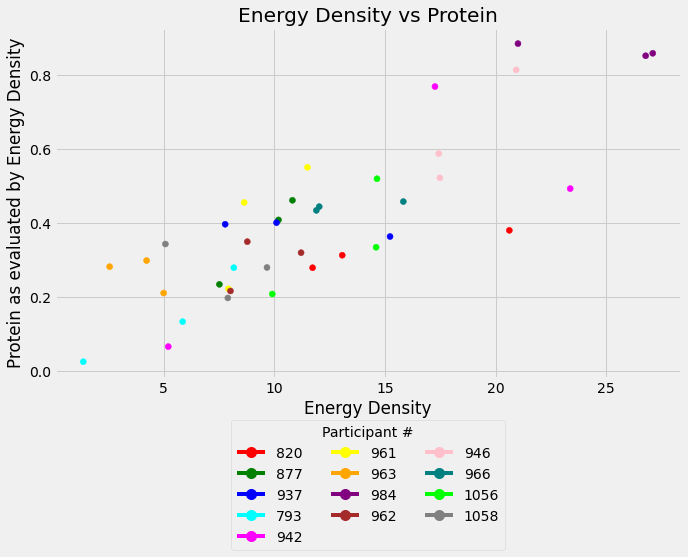

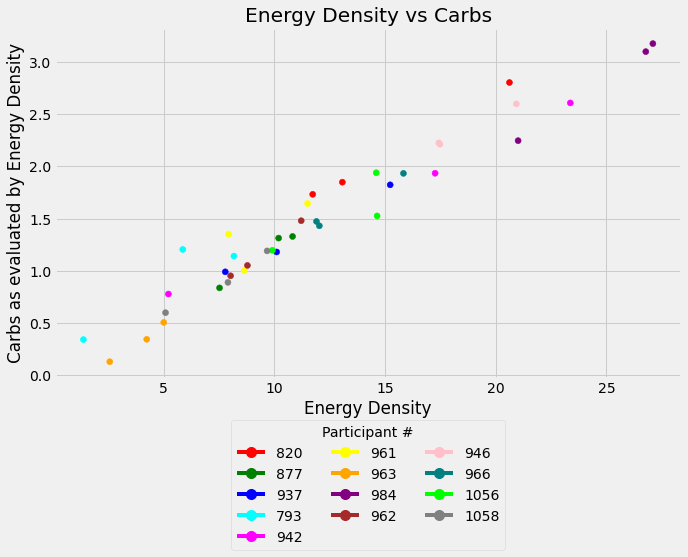

In [19]:
makeGraph("Energy Density", "Fat", "NA")
makeGraph("Energy Density", "Protein", "NA")
makeGraph("Energy Density", "Carbs", "NA")

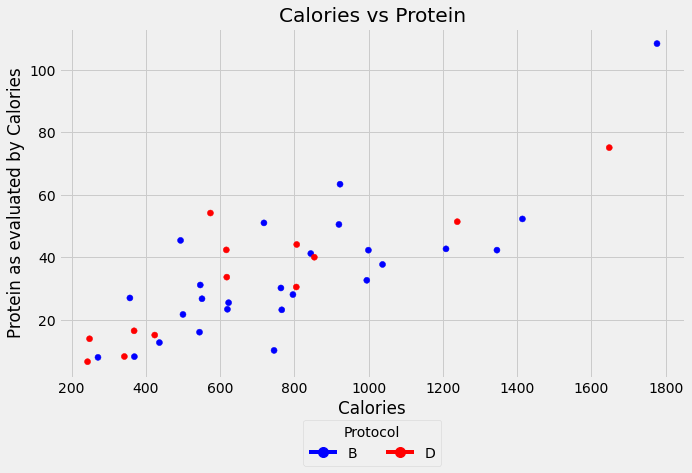

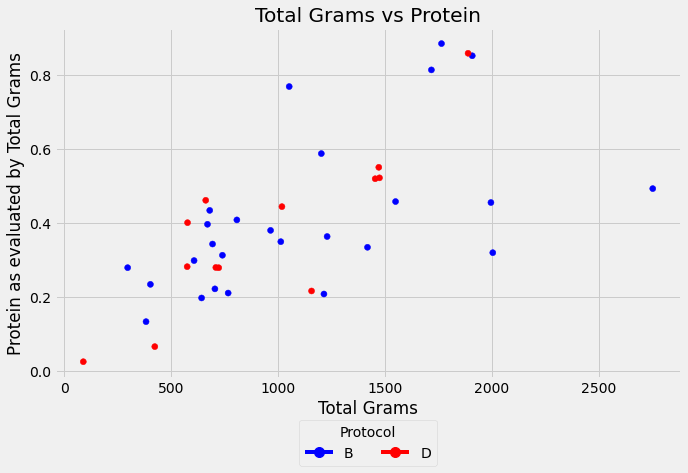

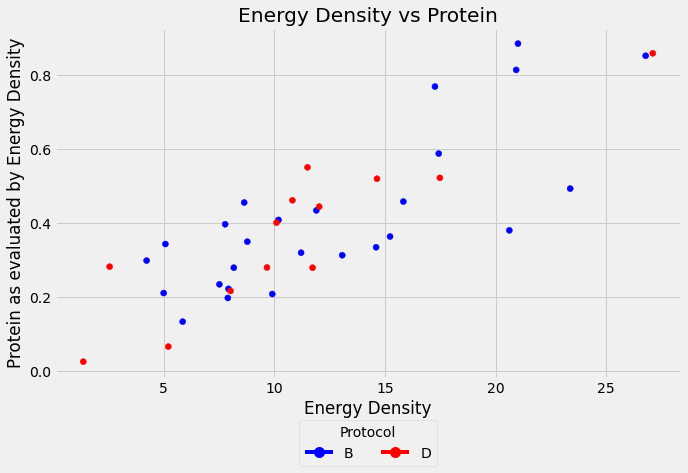

In [20]:
makeGraph("Calories", "Protein", "Phase")
makeGraph("Total Grams", "Protein", "Phase")
makeGraph("Energy Density", "Protein", "Phase")

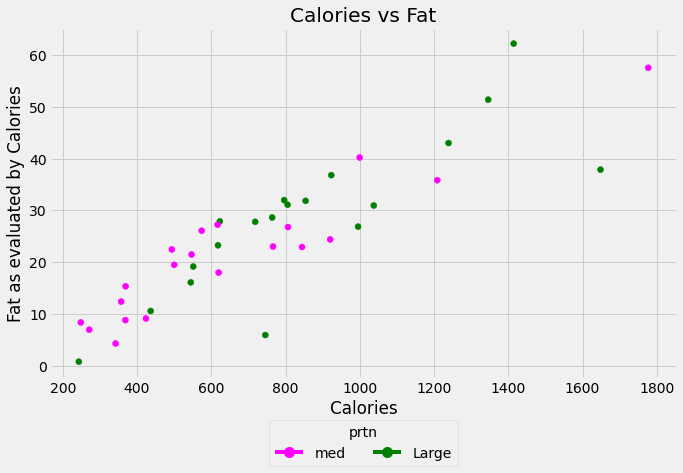

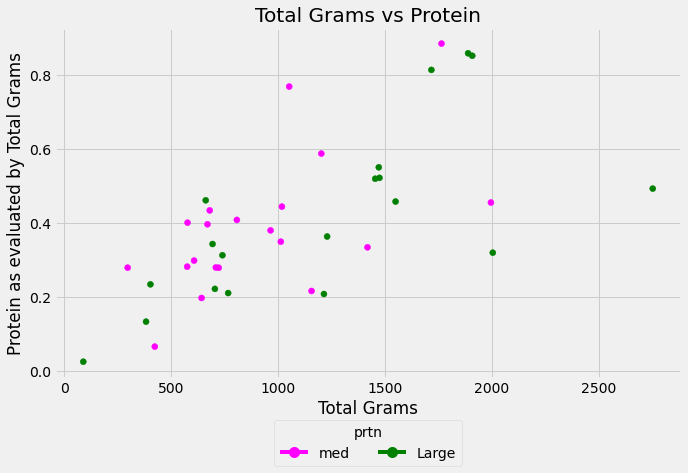

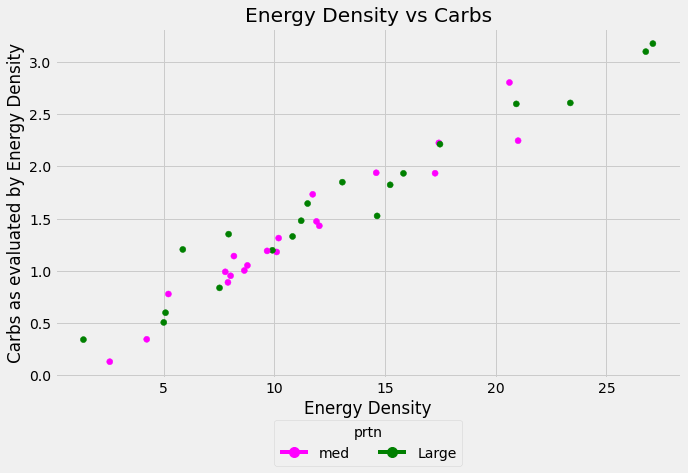

In [21]:
makeGraph("Calories", "Fat", "Prtn")
makeGraph("Total Grams", "Protein", "Prtn")
makeGraph("Energy Density", "Carbs", "Prtn")

In [22]:
def divide_list(lst):
    sublists = [[], [], []]  # Create three empty sublists

    for i, item in enumerate(lst):
        sublist_index = i % 3  # Determine the sublist index based on the position
        sublists[sublist_index].append(item)  # Add the item to the corresponding sublist

    return sublists

def normalize_and_calculate_percentage(data):
    normalized_data = []
    for sublist in data:
        first_value = sublist[0]
        normalized_sublist = [0]
        for value in sublist[1:]:
            percentage = ((value - first_value) / abs(first_value)) * 100
            normalized_sublist.append(percentage)
        normalized_data.append(normalized_sublist)
    return normalized_data

def makeLineGraph(x):
    y = 5
    y_label = 'Protein'
    thing = [[],[]]
    
    thing = produceVals(x, y)
    
    x_values = thing[0]
    y_values = thing[0]
        
    x_labels = ['Med B', 'Large B', 'Med D']
    x_positions = np.arange(len(x_labels))
    
    sublists = [y_values[i:i+3] for i in range(0, len(y_values), 3)]
    sublists = normalize_and_calculate_percentage(sublists)
    
    colors = ['blue', 'pink', 'red', 'cyan', 'orange', 'green', 'magenta', 'lime', 'teal', 'gray', 'yellow', 'brown', 'purple']
    
    participant_list = ['820', '877', '793', '946', '1058', '963', '937', '1056', '942', '966', '961', '984', '962']

    # Create a unique color map for participants
    color_map = {}
    for participant, color in zip(participant_list, colors):
        if participant not in color_map:
            color_map[participant] = color
    
    unique_colors = [color_map[participant] for participant in participant_list]
    
    # Create a larger figure
    plt.figure(figsize=(10, 6))
    
    # Plot the lines
    for i, sublist in enumerate(sublists):
        plt.plot(x_positions, sublist, marker='o', color=unique_colors[i])
    
    # Create a legend
    handles = []
    labels = []
    for participant in participant_list:
        if participant not in labels:
            handles.append(plt.Line2D([], [], marker='o', color=color_map[participant], markersize=10))
            labels.append(participant)
    plt.legend(handles, labels, title='Participant #', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)
    
    # Add labels and title
    plt.xticks(x_positions, x_labels)
    plt.ylabel(x + " in %")
    plt.title(x + " by selection")

    # Show the plot
    plt.show()

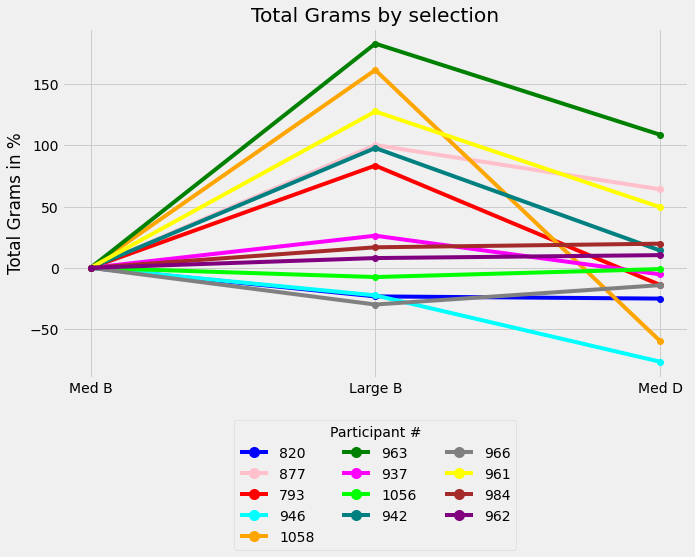

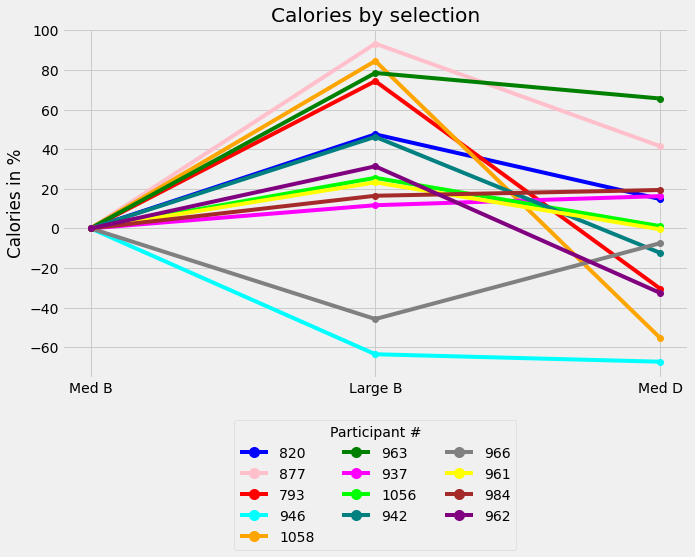

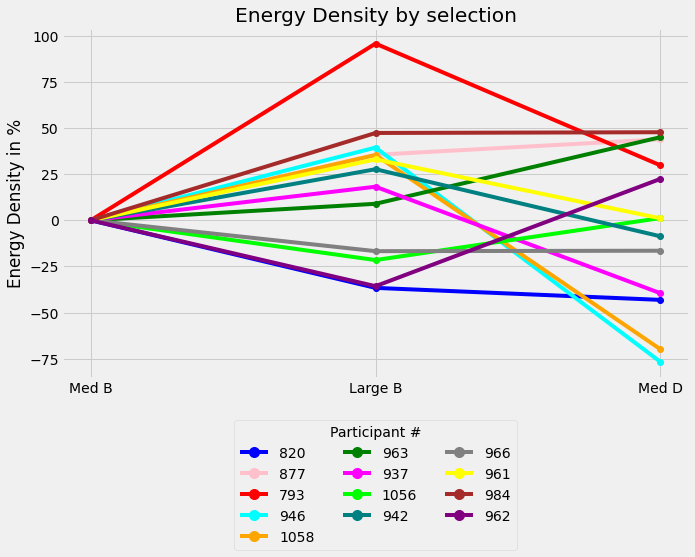

In [23]:
makeLineGraph("Total Grams")
makeLineGraph("Calories")
makeLineGraph("Energy Density")

In [24]:
def doThreePairedTests(val1, val2, combination):
    #val2 is things like protien, fat, carbs, etc; doesnt really matter much here
    vals = produceVals(val1, val2)
    vals = vals[0]
    sublists = divide_list(vals)
    medB = sublists[0]
    largeB = sublists[1]
    medD = sublists[2]
    
    results = [0, 0, 0]
    
#     print("medB & largeB:")
    results[0] = stats.ttest_rel(medB, largeB)
#     print(results[0])
    
#     print("")
    
#     print("medB & medD:")
    results[1] = stats.ttest_rel(medB, medD)
#     print(results[1])
    
#     print("")

    
#     print("largeB & medD:")
    results[2] = stats.ttest_rel(largeB, medD)
#     print(results[2])

    
    if(combination == 0):
        return results[0]
    if(combination == 1):
        return results[1]
    if(combination == 2):
        return results[2]
    return results


    

In [25]:
doThreePairedTests("Total Grams", 5, 3)

[Ttest_relResult(statistic=-2.2472350583531866, pvalue=0.044216985120471189),
 Ttest_relResult(statistic=-0.20743441906323484, pvalue=0.83914912197498692),
 Ttest_relResult(statistic=2.0680313150995473, pvalue=0.060899779589068156)]

In [26]:
TableDF = pd.DataFrame()

num_rows = 3

# Define the formula for each column
# column1_formula = lambda x:doThreePairedTests("Energy Density", x)
# column2_formula = lambda x:doThreePairedTests("Total Grams", x)
# column3_formula = lambda x:doThreePairedTests("Calories", x)

def calculateMs(df, row):
    result = [0, 0]
    result[0] = df.loc[0, 'Column 1']



# Populate the columns with values calculated using the formulas
TableDF['Combination'] = ['medB & largeB', 'medB & medD', 'largeB & medD']
TableDF['T Mean'] = ['1', '2', '3']
TableDF['P Mean'] = ['1', '2', '3']
TableDF['T Median'] = ['1', '2', '3']
TableDF['P Median'] = ['1', '2', '3']
TableDF['Total Grams (T-Value)'] = [doThreePairedTests("Total Grams", 5, 0)[0], doThreePairedTests("Total Grams", 5, 1)[0], doThreePairedTests("Total Grams", 5, 2)[0]]
TableDF['Total Grams (P-Value)'] = [doThreePairedTests("Total Grams", 5, 0)[1], doThreePairedTests("Total Grams", 5, 1)[1], doThreePairedTests("Total Grams", 5, 2)[1]]

TableDF['Calories (T-Value)'] = [doThreePairedTests("Calories", 5, 0)[0], doThreePairedTests("Calories", 5, 1)[0], doThreePairedTests("Calories", 5, 2)[0]]
TableDF['Calories (P-Value)'] = [doThreePairedTests("Calories", 5, 0)[1], doThreePairedTests("Calories", 5, 1)[1], doThreePairedTests("Calories", 5, 2)[1]]

TableDF['Energy Density (T-Value)'] = [doThreePairedTests("Energy Density", 5, 0)[0], doThreePairedTests("Energy Density", 5, 1)[0], doThreePairedTests("Energy Density", 5, 2)[0]]
TableDF['Energy Density (P-Value)'] = [doThreePairedTests("Energy Density", 5, 0)[1], doThreePairedTests("Energy Density", 5, 1)[1], doThreePairedTests("Energy Density", 5, 2)[1]]


TableDF['Total Grams (T-Value)'] = TableDF['Total Grams (T-Value)'].astype(float)
TableDF['Total Grams (P-Value)'] = TableDF['Total Grams (P-Value)'].astype(float)
TableDF['Calories (T-Value)'] = TableDF['Calories (T-Value)'].astype(float)
TableDF['Calories (P-Value)']= TableDF['Calories (P-Value)'].astype(float)
TableDF['Energy Density (T-Value)'] = TableDF['Energy Density (T-Value)'].astype(float)
TableDF['Energy Density (P-Value)'] = TableDF['Energy Density (P-Value)'].astype(float)


TableDF['T Median'] = np.median(TableDF[['Total Grams (T-Value)', 'Calories (T-Value)', 'Energy Density (T-Value)']], axis=1)
TableDF['P Median'] = np.median(TableDF[['Total Grams (P-Value)', 'Calories (P-Value)', 'Energy Density (P-Value)']], axis=1)

TableDF['T Mean'] = np.mean(TableDF[['Total Grams (T-Value)', 'Calories (T-Value)', 'Energy Density (T-Value)']], axis=1)
TableDF['P Mean'] = np.mean(TableDF[['Total Grams (P-Value)', 'Calories (P-Value)', 'Energy Density (P-Value)']], axis=1)

# TableDF['Type'] = ['Total Grams', 'Calories', 'Energy Density', 'Mean', 'Median']
# TableDf['medB & largeB T/P'] = [doThreePairedTests("Total Grams", 5, 0), doThreePairedTests("Calories", 5, 0), doThreePairedTests("Energy Density", 5, 0), 1, 2]


# TableDf['medB & medD T/P'] = ['Total Grams', 'Calories', 'Energy Density', 'Mean', 'Median']


# TableDf['largeB & medD T/P'] = ['Total Grams', 'Calories', 'Energy Density', 'Mean', 'Median']

TableDF = TableDF[['Combination', 'Total Grams (P-Value)', 'Calories (P-Value)', 'Energy Density (P-Value)',
         'Total Grams (T-Value)', 'Calories (T-Value)', 'Energy Density (T-Value)', 'T Mean', 'T Median']]

# TableDF.loc['Median'] = TableDF.median()
# TableDF.loc['Mean'] = TableDF.mean()


TableDF

,Combination,Total Grams (P-Value),Calories (P-Value),Energy Density (P-Value),Total Grams (T-Value),Calories (T-Value),Energy Density (T-Value),T Mean,T Median
0,medB & largeB,0.044217,0.068632,0.500732,-2.247235,-2.000189,-0.694272,-1.647232,-2.000189
1,medB & medD,0.839149,0.836899,0.413952,-0.207434,0.210382,0.846284,0.283077,0.210382
2,largeB & medD,0.060900,0.042566,0.250036,2.068031,2.268334,1.208756,1.848374,2.068031


In [27]:
doThreePairedTests("Energy Density", 5, 0)

Ttest_relResult(statistic=-0.69427192378849623, pvalue=0.50073225703257407)

In [28]:
calorieDataRevised.iloc[:11]
column_sum = calorieDataRevised['weight in grams'].iloc[:11].sum()
print(column_sum)

965.0673


In [29]:
def getFoodDivisionPerPerson():
    result = []
    for i in range(len(dataframes_list)):
        result.append(dataframes_list[i]['Food Type'].value_counts())
    return result

getFoodDivisionPerPerson()

[Fruit        3
 Dessert      2
 Liquid       1
 Bread        1
 Meat         1
 Fries        1
 Vegetable    1
 Rice         1
 Name: Food Type, dtype: int64,
 Fruit        2
 Vegetable    2
 Liquid       1
 Meat         1
 Dessert      1
 Gravy        1
 Pasta        1
 Rice         1
 Sauce        1
 Name: Food Type, dtype: int64,
 Fruit      3
 Liquid     1
 Meat       1
 Dessert    1
 Pasta      1
 Rice       1
 Sauce      1
 Name: Food Type, dtype: int64,
 Soup         1
 Liquid       1
 Meat         1
 Dessert      1
 Fries        1
 Vegetable    1
 Rice         1
 Fruit        1
 Name: Food Type, dtype: int64,
 Soup         1
 Fruit        1
 Vegetable    1
 Dessert      1
 Pasta        1
 Meat         1
 Sauce        1
 Name: Food Type, dtype: int64,
 Vegetable    2
 Liquid       1
 Dessert      1
 Rice         1
 Meat         1
 Fruit        1
 Name: Food Type, dtype: int64,
 Liquid    1
 Bread     1
 Fries     1
 Rice      1
 Meat      1
 Name: Food Type, dtype: int64,
 Liqu

In [30]:
def transform_data(data):
    categories = ['Fruit', 'Dessert', 'Liquid', 'Bread', 'Meat', 'Fries', 'Vegetable', 'Rice', 'Gravy', 'Pasta', 'Sauce', 'Soup', 'Pizza']
    lists = []
    
    for item in data:
        values = [0] * 13
        for category, count in item.items():
            if category in categories:
                index = categories.index(category)
                values[index] = count
        lists.append(values)
    
    return lists

z = transform_data(getFoodDivisionPerPerson())
z

[[3, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
 [2, 1, 1, 0, 1, 0, 2, 1, 1, 1, 1, 0, 0],
 [3, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0],
 [1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0],
 [1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0],
 [1, 1, 1, 0, 1, 0, 2, 1, 0, 0, 0, 0, 0],
 [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0],
 [0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1],
 [0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1],
 [2, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0],
 [3, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0],
 [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
 [2, 1, 0, 1, 2, 0, 4, 0, 0, 0, 0, 1, 0],
 [0, 2, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 2],
 [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
 [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1],
 [1, 1, 1, 0, 1, 0, 2, 1, 0, 0, 0, 0, 1],
 [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0],
 [1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0],
 [1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1],
 [1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
 [1, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1],
 [2, 1, 1, 1, 3, 2, 0, 1, 0, 0, 0, 1, 0],
 [2, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0,

In [31]:
def preferenceFood():
    omegaList = getFoodDivisionPerPerson()
    convert_data(omegaList)
    
    # Extracting item names and frequencies from omegaList
    item_names = []
    frequencies = []

    for item in omegaList:
        item_names.extend(item.keys())
        frequencies.extend(item.values())

    # Creating a dictionary to store the total frequency of each item
    item_totals = {}

    for name, freq in zip(item_names, frequencies):
        item_totals[name] = item_totals.get(name, 0) + freq

    # Sorting items by frequency in descending order
    sorted_items = sorted(item_totals.items(), key=lambda x: x[1], reverse=True)
    sorted_names, sorted_frequencies = zip(*sorted_items)

    # Creating the bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(sorted_names)), sorted_frequencies)

    # Adding labels and titles
    plt.xlabel('Items')
    plt.ylabel('Frequency')
    plt.title('Frequency of Items')

    # Rotating x-axis labels for better readability
    plt.xticks(range(len(sorted_names)), sorted_names, rotation=45, ha='right')

    # Displaying the graph
    plt.tight_layout()
    plt.show()


In [33]:
preferenceFood()

NameError: name 'convert_data' is not defined

ValueError: shape mismatch: objects cannot be broadcast to a single shape

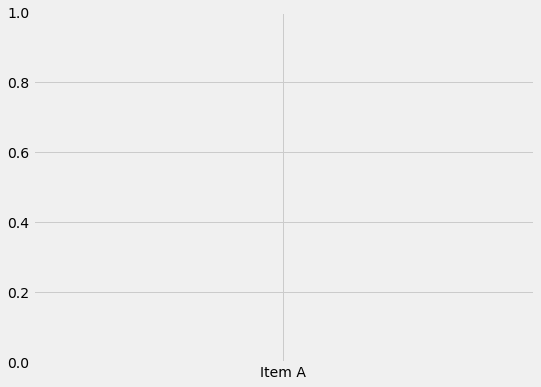

In [34]:
categories = unique_names = [
    'Fruit',
    'Dessert',
    'Liquid',
    'Bread',
    'Meat',
    'Fries',
    'Vegetable',
    'Rice',
    'Gravy',
    'Pasta',
    'Sauce',
    'Soup',
    'Pizza'
]
items = ['Item A', 'Item B', 'Item C']
data = transform_data(getFoodDivisionPerPerson())


# Plotting
plt.figure(figsize=(8, 6))
plt.bar(items, data[0], label=categories[0])
plt.bar(items, data[1], bottom=data[0], label=categories[1])
plt.bar(items, data[2], bottom=[data[0][i] + data[1][i] for i in range(len(items))], label=categories[2])



plt.xlabel('Items')
plt.ylabel('Frequency')
plt.title('Sample Stacked Column Chart')

# Move the legend to the bottom
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=len(categories))

plt.show()

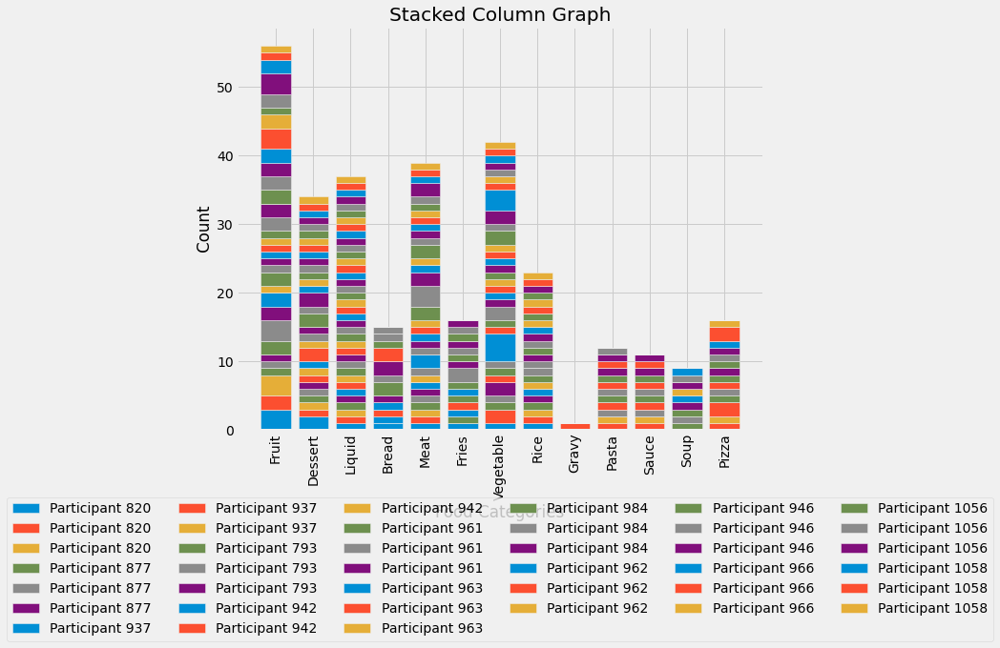

In [35]:

data = transform_data(getFoodDivisionPerPerson())

# Pad lists with zeros to ensure they have the same length
max_length = max(len(d) for d in data)
data = [d + [0] * (max_length - len(d)) for d in data]

categories = ['Fruit', 'Dessert', 'Liquid', 'Bread', 'Meat', 'Fries', 'Vegetable', 'Rice', 'Gravy', 'Pasta', 'Sauce', 'Soup', 'Pizza']
x = np.arange(len(categories))

participant_list = ['820', '820', '820', '877', '877', '877', '937', '937', '937', '793', '793', '793',
                    '942', '942', '942', '961', '961', '961', '963', '963', '963', '984', '984', '984',
                    '962', '962', '962', '946', '946', '946', '966', '966', '966', '1056', '1056', '1056',
                    '1058', '1058', '1058']

fig, ax = plt.subplots(figsize=(12, 10))
bottom = np.zeros(len(categories))

for i, d in enumerate(data):
    participant_id = participant_list[i]
    ax.bar(x, d, bottom=bottom, label=f'Participant {participant_id}')
    bottom += d

ax.set_xticks(x)
ax.set_xticklabels(categories, rotation=90)
ax.set_xlabel('Food Categories')
ax.set_ylabel('Count')
ax.set_title('Stacked Column Graph')

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=6)
plt.tight_layout()
plt.show()

In [36]:
#profiling each participant based on their food choice -> [fruit, water, etc] -> [2, 3, ] -> weigh it according to grams
#

#pca

In [37]:
def evalPersonFoodByCat(df, metric):
    categories = [0, 0, 0, 0, 0, 0, 0]
    
    
    if(metric == 'Total Grams'):
        metric = 'weight in grams'
    if(metric == 'Energy Density'):
        metric = 'energy density'
    #represent: Protein, Fruits/Vegetable, Carbs/Grains, Pizza, Dessert, Beverages, Other
    
    #categories = ['Fruit', 'Dessert', 'Liquid', 'Bread', 'Meat', 'Fries', 'Vegetable', 'Rice', 'Gravy', 'Pasta', 'Sauce', 'Soup', 'Pizza']
    #condensed down to: Fruit/Vegetables, Whole Grains/
    #energy density, Calories,weight in grams,fat grams,carb grams,prot grams
    for index, row in df.iterrows():
#         print(row)
        Category = row['Food Type']
        if(Category == 'Meat'):
            categories[0] += row[metric]
        if(Category == 'Fruit' or Category == 'Vegetable'):
            categories[1] += row[metric]
        if((Category == 'Rice' or Category == 'Bread') or (Category == 'Pasta' or Category == 'Fries')):
            categories[2] += row[metric]
        if(Category == 'Pizza'):
            categories[3] += row[metric]
        if(Category == 'Dessert'):
#             print(row['VR1 Selections'])
            categories[4] += row[metric]
        if(Category == 'Liquid'):
            categories[5] += row[metric]
        if((Category == 'Gravy' or Category == 'Sauce') or Category == 'Soup'):
#             print(Category)
            categories[6] += row[metric]
    return categories
        


In [38]:
evalPersonFoodByCat(dataframes_list[0], "Total Grams")

[72.9368, 53.8858, 274.32570000000004, 0, 563.919, 0.0, 0]

In [39]:
calorieDataShreddedCalories=calorieDataMinimal.copy()

calorieDataShreddedCategories=calorieDataMinimal.copy()


def calorieDataShreddedPipeline(df, metric):
    column_names = ['Energy Density', 'Calories', 'Weight in Grams', 'Fat Grams', 'Carb Grams', 'Protein Grams']
    for i, row in df.iterrows():
        new_values = evalPerson(dataframes_list[i], metric)
        df.loc[i, column_names] = new_values
    return df

def calorieDataShreddedPipelineCat(df, metric):
    column_names = ['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']
    for i, row in df.iterrows():
        new_values = evalPersonFoodByCat(dataframes_list[i], metric)
        df.loc[i, column_names] = new_values
    return df

In [40]:
calorieDataShreddedCalories

,Participant #,prtn,phase
0,820,B,Med
1,820,B,Large
2,820,D,Med
3,877,B,Med
4,877,B,Large
5,877,D,Med
6,937,B,Med
7,937,B,Large
8,937,D,Med
9,793,B,Med


In [41]:
calorieDataShreddedValues = calorieDataShreddedPipeline(calorieDataShreddedCalories, 'Calories')
calorieDataShreddedValues

,Participant #,prtn,phase,Energy Density,Calories,Weight in Grams,Fat Grams,Carb Grams,Protein Grams
0,820,B,Med,20.62,369.3200,965.067300,15.406402,48.166393,8.128532
1,820,B,Large,13.07,544.7600,739.925700,16.158430,77.666660,15.968427
2,820,D,Med,11.73,424.0700,722.526600,9.208115,54.630896,15.041119
3,877,B,Med,7.52,436.7300,403.114300,10.657691,69.190155,12.633808
4,877,B,Large,10.19,844.4768,807.405748,22.964228,136.529479,41.169723
5,877,D,Med,10.82,618.1413,661.792050,23.294548,71.840840,33.610523
6,937,B,Med,7.78,357.2400,669.999300,12.455646,32.872441,26.935019
7,937,B,Large,15.23,623.0800,1229.490500,27.907205,76.683881,25.420189
8,937,D,Med,10.10,248.5800,576.752200,8.450357,29.087532,13.849704
9,793,B,Med,5.86,745.5366,382.670176,6.027396,170.062700,10.123844


In [42]:
calorieDataShreddedCategories = calorieDataShreddedPipelineCat(calorieDataShreddedCategories, 'Total Grams')
calorieDataShreddedCategories['Highest'] = calorieDataShreddedCategories[['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']].apply(lambda row: row.idxmax(), axis=1)
calorieDataShreddedCategories

,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
0,820,B,Med,72.9368,53.8858,274.3257,0.0000,563.9190,0.000000,0.000000,Dessert
1,820,B,Large,151.5480,112.6139,194.2977,0.0000,236.5359,0.000000,44.930200,Dessert
2,820,D,Med,243.5840,19.1178,194.2977,0.0000,236.5359,0.000000,28.991200,Protein
3,877,B,Med,72.9368,42.6112,203.8540,0.0000,26.3031,0.000000,57.409200,Carbs/Grains
4,877,B,Large,89.0890,154.4504,215.6700,0.0000,236.5359,0.000000,111.660448,Dessert
5,877,D,Med,89.0890,88.4985,92.7680,0.0000,236.5359,154.900650,0.000000,Dessert
6,937,B,Med,294.5722,0.0000,375.4271,0.0000,0.0000,0.000000,0.000000,Carbs/Grains
7,937,B,Large,0.0000,99.9718,311.2668,123.8760,327.3831,0.000000,366.992800,Other
8,937,D,Med,126.0952,0.0000,90.2451,123.8760,236.5359,0.000000,0.000000,Dessert
9,793,B,Med,0.0000,51.5325,77.0295,0.0000,0.0000,170.314080,83.794096,Beverages


In [43]:
calorieDataShreddedCategories = calorieDataShreddedPipelineCat(calorieDataShreddedCategories, 'Energy Density')
calorieDataShreddedCategories['Highest'] = calorieDataShreddedCategories[['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']].apply(lambda row: row.idxmax(), axis=1)
calorieDataShreddedCategories

,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
0,820,B,Med,1.73,2.23,7.26,0.00,9.40,0.00,0.00,Dessert
1,820,B,Large,1.73,2.69,2.81,0.00,4.87,0.00,0.97,Dessert
2,820,D,Med,1.73,1.70,2.81,0.00,4.87,0.00,0.62,Dessert
3,877,B,Med,1.73,0.85,3.29,0.00,1.29,0.00,0.36,Carbs/Grains
4,877,B,Large,1.78,0.98,1.58,0.00,4.87,0.00,0.98,Dessert
5,877,D,Med,1.78,2.37,1.30,0.00,4.87,0.50,0.00,Dessert
6,937,B,Med,1.78,0.00,6.00,0.00,0.00,0.00,0.00,Carbs/Grains
7,937,B,Large,0.00,0.46,4.70,2.22,4.53,0.00,3.32,Carbs/Grains
8,937,D,Med,1.78,0.00,1.23,2.22,4.87,0.00,0.00,Dessert
9,793,B,Med,0.00,1.61,2.81,0.00,0.00,0.46,0.98,Carbs/Grains


In [44]:
calorieDataShreddedCategories = calorieDataShreddedPipelineCat(calorieDataShreddedCategories, 'Calories')
calorieDataShreddedCategories['Highest'] = calorieDataShreddedCategories[['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']].apply(lambda row: row.idxmax(), axis=1)
calorieDataShreddedCategories.columns

Index(['Participant #', 'prtn', 'phase', 'Protein', 'Fruits/Vegetables',
       'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other', 'Highest'],
      dtype='object')

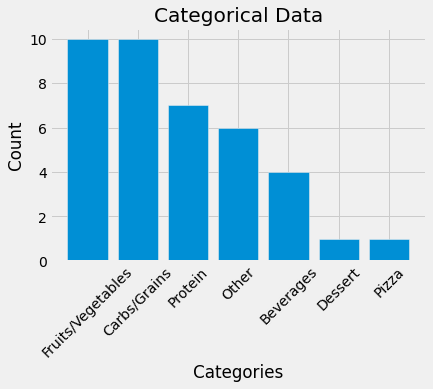

In [45]:
category_counts = calorieDataShreddedCategories['Highest'].value_counts()

plt.bar(category_counts.index, category_counts.values)
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Categorical Data')
plt.xticks(rotation=45)


plt.show()


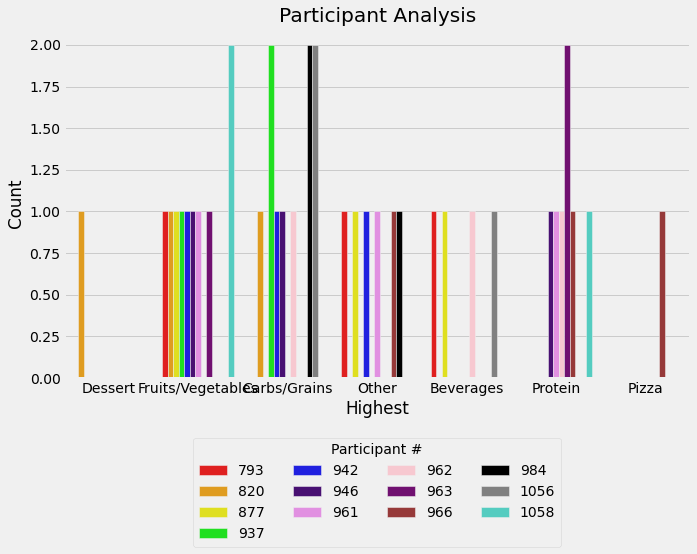

[[3, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0], [2, 1, 1, 0, 1, 0, 2, 1, 1, 1, 1, 0, 0], [3, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0], [1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0], [1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0], [1, 1, 1, 0, 1, 0, 2, 1, 0, 0, 0, 0, 0], [0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0], [0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1], [0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1], [2, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0], [3, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0], [2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [2, 1, 0, 1, 2, 0, 4, 0, 0, 0, 0, 1, 0], [0, 2, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 2], [1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0], [2, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1], [1, 1, 1, 0, 1, 0, 2, 1, 0, 0, 0, 0, 1], [1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0], [1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0], [1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1], [1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0], [1, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1], [2, 1, 1, 1, 3, 2, 0, 1, 0, 0, 0, 1, 0], [2, 2, 1, 2, 2, 1, 1, 1, 0, 0, 0, 0, 1], [0, 1, 1, 0, 1,

In [46]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you already have a DataFrame called 'df' with columns 'Participant #' and 'Highest'

# Define a custom color palette with 13 distinct colors
custom_palette = ['#FF0000', '#FFA500', '#FFFF00', '#00FF00', '#0000FF', '#4B0082', '#EE82EE',
                  '#FFC0CB', '#800080', '#A52A2A', '#000000', '#808080', '#40E0D0']

plt.figure(figsize=(10, 6))

sns.countplot(x='Highest', hue='Participant #', data=calorieDataShreddedCategories, palette=custom_palette)

plt.xlabel('Highest')
plt.ylabel('Count')
plt.title('Participant Analysis')

plt.legend(title='Participant #', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=4)

plt.show()

print(data)



In [47]:
#parallel coordinate
#pca + multidimensional scaling

In [48]:
def parallel_coord_plot(df):
    data = {
        'Participant #': df['Participant #'],  
        'Protein': df['Protein'],  
        'Fruits/Vegetables': df['Fruits/Vegetables'],  
        'Carbs/Grains': df['Carbs/Grains'],  
        'Pizza': df['Pizza'],  
        'Dessert': df['Dessert'],  
        'Beverages': df['Beverages'],  
        'Other': df['Other'], 
        'Highest': df['Highest'] 
    }

    df = pd.DataFrame(data)

    # Create the parallel coordinate plot
    fig = px.parallel_coordinates(df, color='Participant #', labels={'Country': 'Country'})

    # Show the plot
    fig.show()

    return 1

parallel_coord_plot(calorieDataShreddedCategories)
    

1

In [49]:
num_dfs = len(calorieDataShreddedCategories) // 3

# Create a list to store the smaller DataFrames
dfs_list = []

# Split the DataFrame into smaller DataFrames
for i in range(num_dfs):
    start_index = i * 3
    end_index = (i + 1) * 3
    df_subset = calorieDataShreddedCategories.iloc[start_index:end_index]
    dfs_list.append(df_subset)

dfs_list[12]



,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
36,1058,B,Med,140.80,357.47,0.00,0.0,48.57,0.0,0.0,Fruits/Vegetables
37,1058,B,Large,165.49,368.87,73.37,0.0,110.54,0.0,0.0,Fruits/Vegetables
38,1058,D,Med,175.08,71.58,73.37,0.0,48.57,0.0,0.0,Protein


In [50]:

    parallel_coord_plot(dfs_list[1])


1

In [51]:
    parallel_coord_plot(dfs_list[0])


1

In [52]:
    parallel_coord_plot(dfs_list[4])
    parallel_coord_plot(dfs_list[5])

1

In [53]:
import pandas as pd
from sklearn.manifold import MDS
import matplotlib.pyplot as plt

# Load the DataFrame
df = calorieDataShreddedCategories

# Select the relevant columns for analysis
selected_columns = ['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other', 'Highest']
data = df[selected_columns]

# Compute the similarity or dissimilarity matrix
# Use your chosen similarity or dissimilarity measure
similarity_matrix = calculate_similarity_matrix(data)

# Apply multidimensional scaling
mds = MDS(n_components=2, dissimilarity='precomputed')
reduced_data = mds.fit_transform(similarity_matrix)

# Visualize the results
plt.scatter(reduced_data[:, 0], reduced_data[:, 1])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Multidimensional Scaling')
plt.show()


NameError: name 'calculate_similarity_matrix' is not defined

In [54]:
# Extract the numerical columns for PCA
numerical_columns = ['Participant #', 'energy density', 'Calories', 'weight in grams', 'fat grams', 'carb grams', 'prot grams']
data = pcaReadyData[numerical_columns]

# Group the data by participant and calculate the mean for each variable
grouped_data = data.groupby('Participant #').mean().reset_index()

# Standardize the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(grouped_data[numerical_columns])

# Apply PCA
pca = PCA(n_components=2)  # Set the number of principal components to retain
pca.fit(data_scaled)
transformed_data = pca.transform(data_scaled)

# Create a new DataFrame with the transformed data and participant information
df_transformed = pd.DataFrame(transformed_data, columns=['PC1', 'PC2'])
df_transformed['Participant #'] = grouped_data['Participant #']

# Print the transformed DataFrame
print(df_transformed)

NameError: name 'pcaReadyData' is not defined

cluster -> mean -> coordinate

radarplot -> percentage/magnitude -> look into overlap

In [55]:
def makeSpiderPlot(df):
    categories = ['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']
    N = len(categories)

    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={'polar': True})

    # Reset index before iterating over rows
    df.reset_index(drop=True, inplace=True)

    for i in range(len(df)):
        values = df.loc[i, categories].tolist()
        values += values[:1]
        participant = df.loc[i, 'Participant #']
        phase = df.loc[i, 'phase']
        label = f"{participant}: {phase}"
        ax.plot(angles, values, label=label)

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)

    ax.legend(title='Participant #', loc='upper right', bbox_to_anchor=(1.3, 1))

    # Add color-coded key
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = list(set(labels))
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    key_labels = []
    for i, label in enumerate(unique_labels):
        key_labels.append(f"{label}: {categories[i]}")

    plt.legend(handles, key_labels, title='Key', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4, fontsize='small')
    plt.title('Radar Plot')

    plt.show()
    
def makeSpiderPlotByPercentage(df):
    categories = ['Protein', 'Fruits/Vegetables', 'Carbs/Grains', 'Pizza', 'Dessert', 'Beverages', 'Other']
    N = len(categories)

    angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={'polar': True})

    # Reset index before iterating over rows
    df.reset_index(drop=True, inplace=True)

    for i in range(len(df)):
        values = df.loc[i, categories].tolist()
        total = sum(values)  # Calculate the total value
        percentages = [value / total * 100 for value in values]  # Calculate the percentage for each category
        percentages += percentages[:1]  # Repeat the first value to close the loop
        participant = df.loc[i, 'Participant #']
        phase = df.loc[i, 'phase']
        label = f"{participant}: {phase}"
        ax.plot(angles, percentages, label=label)  # Plot the percentages

    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories)

    ax.legend(title='Participant #', loc='upper right', bbox_to_anchor=(1.3, 1))

    # Add color-coded key
    handles, labels = ax.get_legend_handles_labels()
    unique_labels = list(set(labels))
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    key_labels = []
    for i, label in enumerate(unique_labels):
        key_labels.append(f"{label}: {categories[i]}")

    plt.legend(handles, key_labels, title='Key', loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=4, fontsize='small')
    plt.title('Radar Plot')

    plt.show()

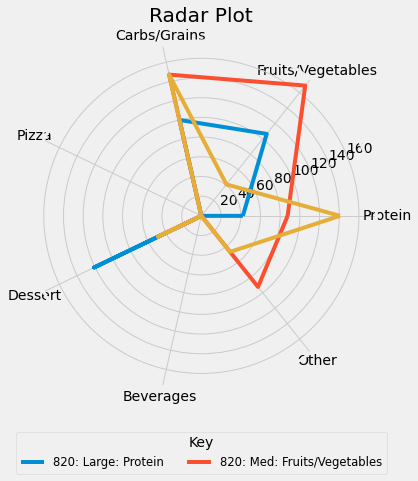

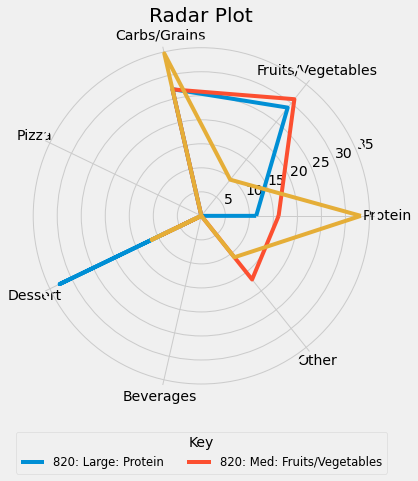

In [56]:
makeSpiderPlot(dfs_list[0])
makeSpiderPlotByPercentage(dfs_list[0])

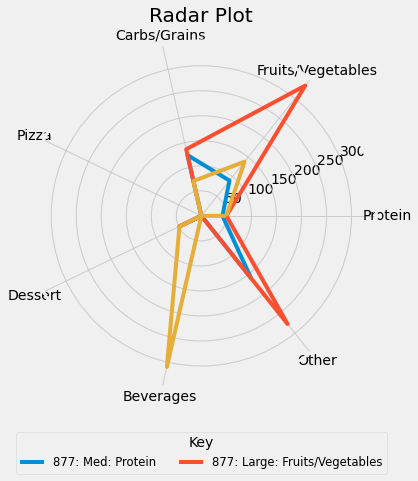

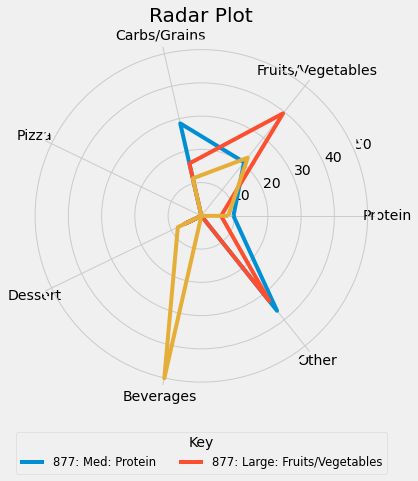

In [57]:
makeSpiderPlot(dfs_list[1])
makeSpiderPlotByPercentage(dfs_list[1])

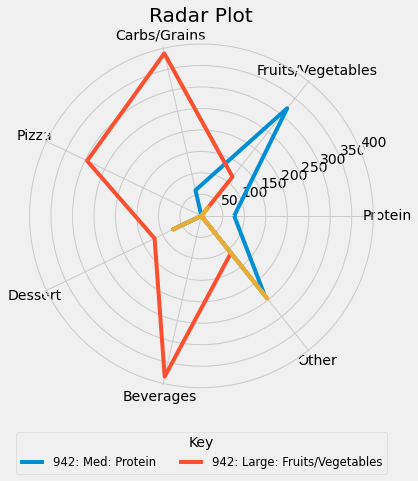

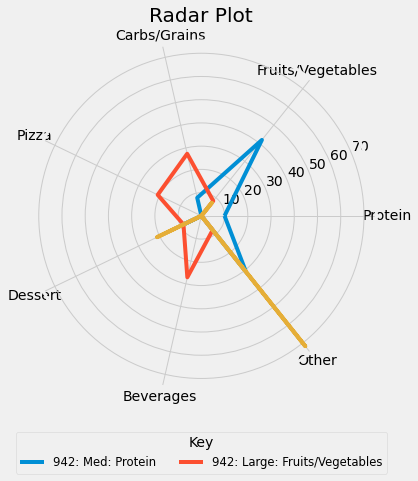

In [58]:
makeSpiderPlot(dfs_list[4])
makeSpiderPlotByPercentage(dfs_list[4])

In [59]:
def linearRegressionCorrelationCo(col1, col2):
    x = calorieDataShreddedCategories[col1].values
    y = calorieDataShreddedCategories[col2].values

    # Calculate the correlation coefficient
    correlation_matrix = np.corrcoef(x, y)
    correlation = correlation_matrix[0, 1]

    print("Correlation coefficient (r-value):", correlation)
    # Perform linear regression to get the slope and intercept
    slope, intercept = np.polyfit(x, y, 1)

    # Create the regression line
    regression_line = slope * x + intercept

    # Plot the scatter plot of x and y
    plt.scatter(x, y, label='Data')

    # Plot the regression line
    plt.plot(x, regression_line, color='red', label='Linear Regression')

    # Add labels and title to the plot
    plt.xlabel(col1)
    plt.ylabel(col2)
    plt.title('Linear Regression')

    # Add a legend
    plt.legend()

    # Display the plot
    plt.show()

Correlation coefficient (r-value): -0.0696487138516


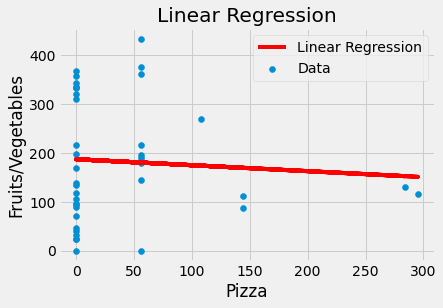

In [60]:
linearRegressionCorrelationCo('Pizza', 'Fruits/Vegetables')

Correlation coefficient (r-value): -0.0696487138516


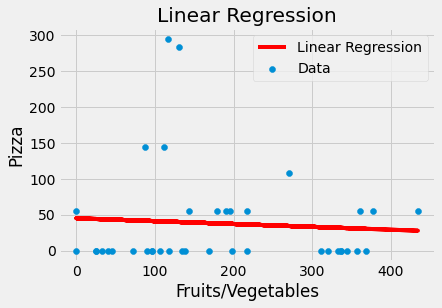

In [61]:
linearRegressionCorrelationCo('Fruits/Vegetables', 'Pizza')


Correlation coefficient (r-value): 0.220750135467


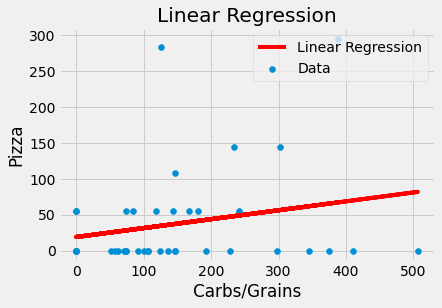

In [62]:
linearRegressionCorrelationCo('Carbs/Grains', 'Pizza')

In [63]:
def RProcess(df, col1, col2):
    x = col1
    y = col2

    # Calculate the correlation coefficient
    correlation_matrix = np.corrcoef(x, y)
    correlation = correlation_matrix[0, 1]

    print("Correlation coefficient (r-value):", correlation)


def runThroughDfForRVal(df):
    for i in range((df.shape[1])):
        for j in range(i+1, (df.shape[1])):
            print(df.columns[i] , " and ", df.columns[j])
            RProcess(df, df.iloc[:, i], df.iloc[:, j])
            

In [64]:
cols_to_drop = ['Participant #', 'prtn', 'phase', 'Highest']
calorieDataShreddedCategories2 = calorieDataShreddedCategories.drop(cols_to_drop, axis=1)
runThroughDfForRVal(calorieDataShreddedCategories2)

Protein  and  Fruits/Vegetables
Correlation coefficient (r-value): 0.296673548143
Protein  and  Carbs/Grains
Correlation coefficient (r-value): 0.114526564171
Protein  and  Pizza
Correlation coefficient (r-value): 0.00978171358887
Protein  and  Dessert
Correlation coefficient (r-value): 0.302440267662
Protein  and  Beverages
Correlation coefficient (r-value): 0.0368041640626
Protein  and  Other
Correlation coefficient (r-value): -0.38178065398
Fruits/Vegetables  and  Carbs/Grains
Correlation coefficient (r-value): -0.141109967603
Fruits/Vegetables  and  Pizza
Correlation coefficient (r-value): -0.0696487138516
Fruits/Vegetables  and  Dessert
Correlation coefficient (r-value): 0.176619830309
Fruits/Vegetables  and  Beverages
Correlation coefficient (r-value): 0.116325519843
Fruits/Vegetables  and  Other
Correlation coefficient (r-value): 0.0969645433318
Carbs/Grains  and  Pizza
Correlation coefficient (r-value): 0.220750135467
Carbs/Grains  and  Dessert
Correlation coefficient (r-value)

Correlation coefficient (r-value): 0.302440267662


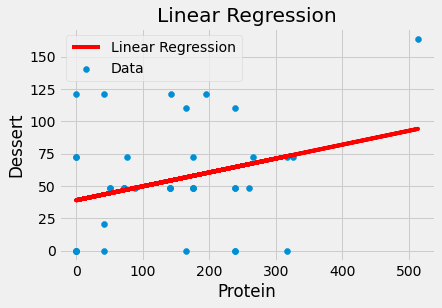

In [65]:
linearRegressionCorrelationCo('Protein', 'Dessert')

Correlation coefficient (r-value): -0.38178065398


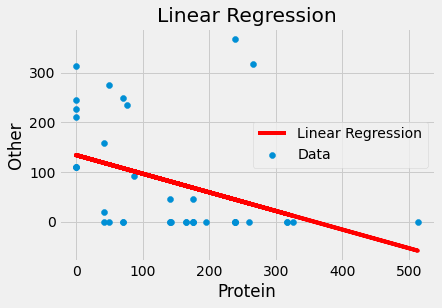

In [66]:
linearRegressionCorrelationCo('Protein', 'Other')

Correlation coefficient (r-value): 0.585875328692


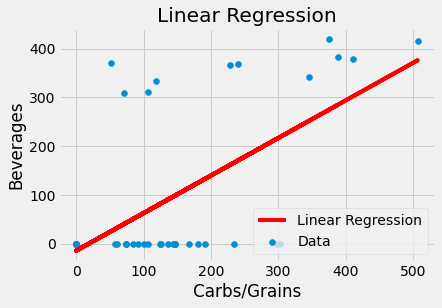

Correlation coefficient (r-value): 0.00195195667224


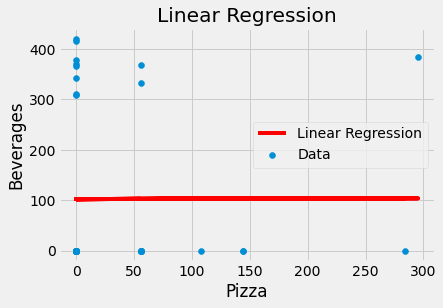

Correlation coefficient (r-value): 0.116325519843


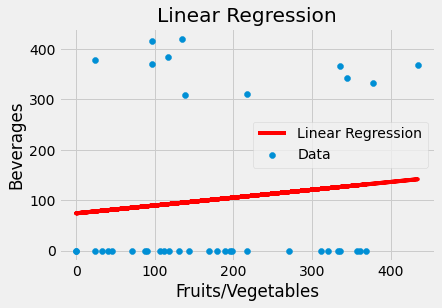

Correlation coefficient (r-value): 0.0368041640626


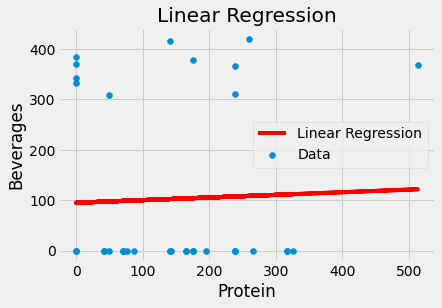

In [67]:
linearRegressionCorrelationCo('Carbs/Grains', 'Beverages')

linearRegressionCorrelationCo('Pizza', 'Beverages')
linearRegressionCorrelationCo('Fruits/Vegetables', 'Beverages')
linearRegressionCorrelationCo('Protein', 'Beverages')

Correlation coefficient (r-value): 0.350641826198


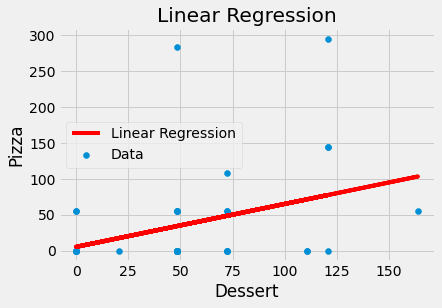

In [68]:
linearRegressionCorrelationCo('Dessert', 'Pizza')

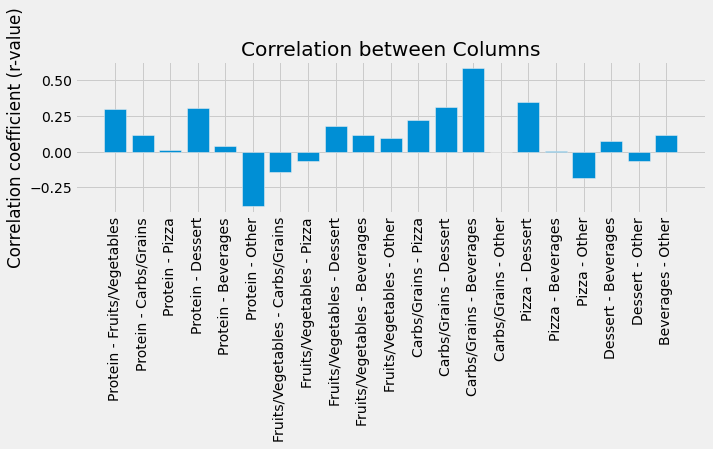

In [69]:
import matplotlib.pyplot as plt

correlations = {
    ('Protein', 'Fruits/Vegetables'): 0.296673548143,
    ('Protein', 'Carbs/Grains'): 0.114526564171,
    ('Protein', 'Pizza'): 0.00978171358887,
    ('Protein', 'Dessert'): 0.302440267662,
    ('Protein', 'Beverages'): 0.0368041640626,
    ('Protein', 'Other'): -0.38178065398,
    ('Fruits/Vegetables', 'Carbs/Grains'): -0.141109967603,
    ('Fruits/Vegetables', 'Pizza'): -0.0696487138516,
    ('Fruits/Vegetables', 'Dessert'): 0.176619830309,
    ('Fruits/Vegetables', 'Beverages'): 0.116325519843,
    ('Fruits/Vegetables', 'Other'): 0.0969645433318,
    ('Carbs/Grains', 'Pizza'): 0.220750135467,
    ('Carbs/Grains', 'Dessert'): 0.31008786805,
    ('Carbs/Grains', 'Beverages'): 0.585875328692,
    ('Carbs/Grains', 'Other'): -0.00321619706878,
    ('Pizza', 'Dessert'): 0.350641826198,
    ('Pizza', 'Beverages'): 0.00195195667224,
    ('Pizza', 'Other'): -0.18389182782,
    ('Dessert', 'Beverages'): 0.0704521250383,
    ('Dessert', 'Other'): -0.0670348919408,
    ('Beverages', 'Other'): 0.114902698059
}

column_pairs = list(correlations.keys())
correlation_values = list(correlations.values())

fig, ax = plt.subplots(figsize=(10, 6))

ax.bar(range(len(correlation_values)), correlation_values)

ax.set_xticks(range(len(correlation_values)))
ax.set_xticklabels([f'{col1} - {col2}' for col1, col2 in column_pairs], rotation=90)

ax.set_ylabel('Correlation coefficient (r-value)')

ax.set_title('Correlation between Columns')

plt.tight_layout()
plt.show()


# The r closest to 1 is Carbs/Grains - Beverages 

# The r closest to -1 is Protein - Other

In [70]:
def ExpRegressProcess(df, col1, col2):
    x = col1
    y = np.log(col2)
    correlation_matrix = np.corrcoef(x, y)
    correlation = correlation_matrix[0, 1]

    print("Correlation coefficient (r-value):", correlation)
    
    
def PowerRegressProcess(df, col1, col2):
    x = np.log(col1) 
    y = np.log(col2)
    correlation_matrix = np.corrcoef(x, y)
    correlation = correlation_matrix[0, 1]

    print("Correlation coefficient (r-value):", correlation)


In [71]:
for i in range((calorieDataShreddedCategories2.shape[1])):
    for j in range(i+1, (calorieDataShreddedCategories2.shape[1])):
        print(calorieDataShreddedCategories2.columns[i] , " and ", calorieDataShreddedCategories2.columns[j])
        ExpRegressProcess(calorieDataShreddedCategories2, calorieDataShreddedCategories2.iloc[:, i], calorieDataShreddedCategories2.iloc[:, j])

Protein  and  Fruits/Vegetables
Correlation coefficient (r-value): nan
Protein  and  Carbs/Grains
Correlation coefficient (r-value): nan
Protein  and  Pizza
Correlation coefficient (r-value): nan
Protein  and  Dessert
Correlation coefficient (r-value): nan
Protein  and  Beverages
Correlation coefficient (r-value): nan
Protein  and  Other
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Carbs/Grains
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Pizza
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Dessert
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Beverages
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Other
Correlation coefficient (r-value): nan
Carbs/Grains  and  Pizza
Correlation coefficient (r-value): nan
Carbs/Grains  and  Dessert
Correlation coefficient (r-value): nan
Carbs/Grains  and  Beverages
Correlation coefficient (r-value): nan
Carbs/Grains  and  Other
Correlation coefficient (r-value): nan
P

C:\Users\Viraj\anaconda3\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning:

divide by zero encountered in log

C:\Users\Viraj\anaconda3\lib\site-packages\numpy\lib\function_base.py:2536: RuntimeWarning:

invalid value encountered in subtract



In [72]:
for i in range((calorieDataShreddedCategories2.shape[1])):
    for j in range(i+1, (calorieDataShreddedCategories2.shape[1])):
        print(calorieDataShreddedCategories2.columns[i] , " and ", calorieDataShreddedCategories2.columns[j])
        PowerRegressProcess(calorieDataShreddedCategories2, calorieDataShreddedCategories2.iloc[:, i], calorieDataShreddedCategories2.iloc[:, j])

Protein  and  Fruits/Vegetables
Correlation coefficient (r-value): nan
Protein  and  Carbs/Grains
Correlation coefficient (r-value): nan
Protein  and  Pizza
Correlation coefficient (r-value): nan
Protein  and  Dessert
Correlation coefficient (r-value): nan
Protein  and  Beverages
Correlation coefficient (r-value): nan
Protein  and  Other
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Carbs/Grains
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Pizza
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Dessert
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Beverages
Correlation coefficient (r-value): nan
Fruits/Vegetables  and  Other
Correlation coefficient (r-value): nan
Carbs/Grains  and  Pizza
Correlation coefficient (r-value): nan
Carbs/Grains  and  Dessert
Correlation coefficient (r-value): nan
Carbs/Grains  and  Beverages
Correlation coefficient (r-value): nan
Carbs/Grains  and  Other
Correlation coefficient (r-value): nan
P

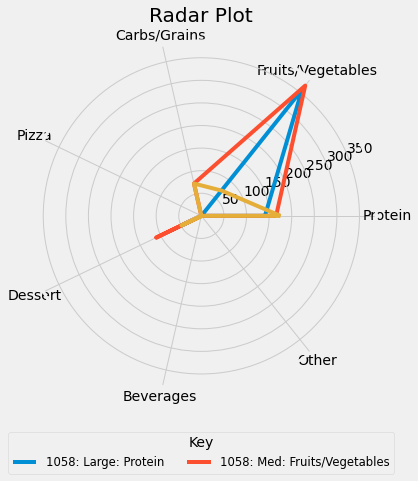

In [73]:
makeSpiderPlot(dfs_list[12])


In [74]:
dfs_list[0]

,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
0,820,B,Med,42.16,106.45,99.87,0.0,120.84,0.0,0.00,Dessert
1,820,B,Large,87.60,169.20,147.09,0.0,48.57,0.0,92.30,Fruits/Vegetables
2,820,D,Med,140.80,40.85,147.09,0.0,48.57,0.0,46.76,Carbs/Grains


In [75]:
df


,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
0,820,B,Med,42.16,106.45,99.87,0.00,120.84,0.0000,0.0000,Dessert
1,820,B,Large,87.60,169.20,147.09,0.00,48.57,0.0000,92.3000,Fruits/Vegetables
2,820,D,Med,140.80,40.85,147.09,0.00,48.57,0.0000,46.7600,Carbs/Grains
3,877,B,Med,42.16,90.11,124.60,0.00,20.39,0.0000,159.4700,Other
4,877,B,Large,50.05,332.96,136.50,0.00,48.57,0.0000,276.3968,Fruits/Vegetables
5,877,D,Med,50.05,138.36,71.36,0.00,48.57,309.8013,0.0000,Beverages
6,937,B,Med,165.49,0.00,191.75,0.00,0.00,0.0000,0.0000,Carbs/Grains
7,937,B,Large,0.00,217.33,167.14,55.80,72.27,0.0000,110.5400,Fruits/Vegetables
8,937,D,Med,70.84,0.00,73.37,55.80,48.57,0.0000,0.0000,Carbs/Grains
9,793,B,Med,0.00,96.10,51.75,0.00,0.00,370.2480,227.4386,Beverages


In [76]:
calorieDataShreddedCategories2

,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other
0,42.16,106.45,99.87,0.00,120.84,0.0000,0.0000
1,87.60,169.20,147.09,0.00,48.57,0.0000,92.3000
2,140.80,40.85,147.09,0.00,48.57,0.0000,46.7600
3,42.16,90.11,124.60,0.00,20.39,0.0000,159.4700
4,50.05,332.96,136.50,0.00,48.57,0.0000,276.3968
5,50.05,138.36,71.36,0.00,48.57,309.8013,0.0000
6,165.49,0.00,191.75,0.00,0.00,0.0000,0.0000
7,0.00,217.33,167.14,55.80,72.27,0.0000,110.5400
8,70.84,0.00,73.37,55.80,48.57,0.0000,0.0000
9,0.00,96.10,51.75,0.00,0.00,370.2480,227.4386


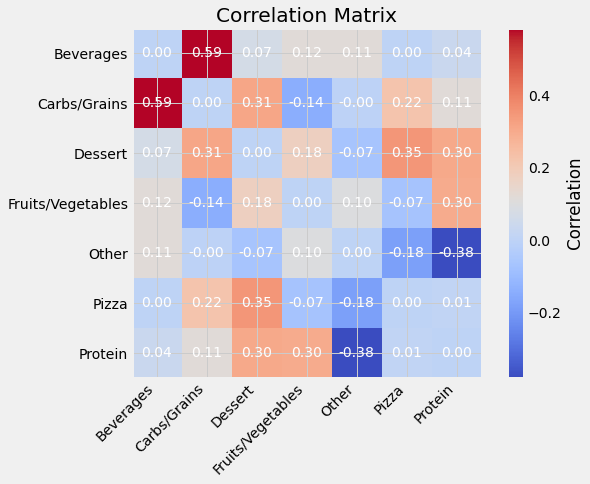

In [77]:
correlations = {
    ('Protein', 'Fruits/Vegetables'): 0.296673548143,
    ('Protein', 'Carbs/Grains'): 0.114526564171,
    ('Protein', 'Pizza'): 0.00978171358887,
    ('Protein', 'Dessert'): 0.302440267662,
    ('Protein', 'Beverages'): 0.0368041640626,
    ('Protein', 'Other'): -0.38178065398,
    ('Fruits/Vegetables', 'Carbs/Grains'): -0.141109967603,
    ('Fruits/Vegetables', 'Pizza'): -0.0696487138516,
    ('Fruits/Vegetables', 'Dessert'): 0.176619830309,
    ('Fruits/Vegetables', 'Beverages'): 0.116325519843,
    ('Fruits/Vegetables', 'Other'): 0.0969645433318,
    ('Carbs/Grains', 'Pizza'): 0.220750135467,
    ('Carbs/Grains', 'Dessert'): 0.31008786805,
    ('Carbs/Grains', 'Beverages'): 0.585875328692,
    ('Carbs/Grains', 'Other'): -0.00321619706878,
    ('Pizza', 'Dessert'): 0.350641826198,
    ('Pizza', 'Beverages'): 0.00195195667224,
    ('Pizza', 'Other'): -0.18389182782,
    ('Dessert', 'Beverages'): 0.0704521250383,
    ('Dessert', 'Other'): -0.0670348919408,
    ('Beverages', 'Other'): 0.114902698059
}

items = sorted(list(set(item for pair in correlations.keys() for item in pair)))

corr_matrix = np.zeros((len(items), len(items)))

for i, item1 in enumerate(items):
    for j, item2 in enumerate(items):
        if (item1, item2) in correlations:
            corr_matrix[i, j] = correlations[(item1, item2)]
        elif (item2, item1) in correlations:
            corr_matrix[i, j] = correlations[(item2, item1)]

plt.figure(figsize=(8, 6))
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='nearest')

for i in range(len(items)):
    for j in range(len(items)):
        plt.text(j, i, f'{corr_matrix[i, j]:.2f}', ha='center', va='center', color='w')

plt.colorbar(label='Correlation')
plt.xticks(np.arange(len(items)), items, rotation=45, ha='right')
plt.yticks(np.arange(len(items)), items)
plt.title('Correlation Matrix')
plt.show()



NameError: name 'your_function' is not defined

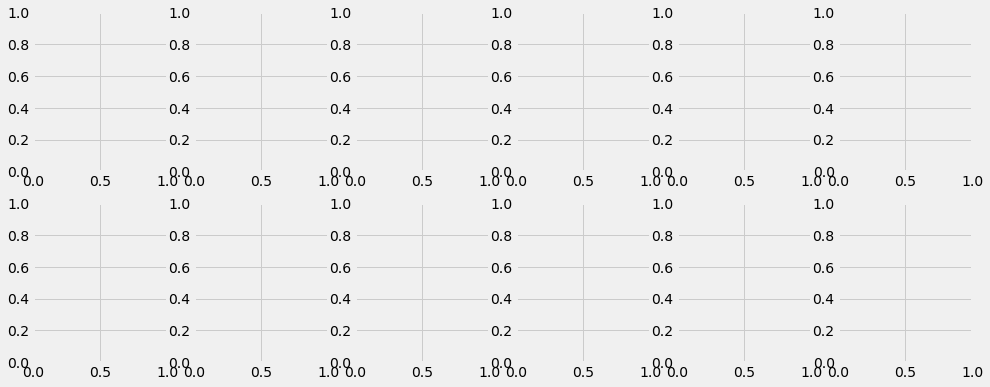

In [78]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(2, 6, figsize=(15, 6))

x = np.linspace(-5, 5, 100)  # Adjust the range according to your function's domain

for i in range(2):
    for j in range(5):
        axs[i, j].plot(x, your_function(x))
        axs[i, j].set_title(f"Plot {i*5 + j + 1}")

plt.tight_layout()
plt.show()


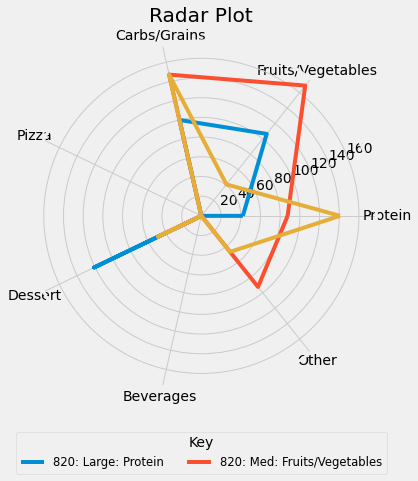

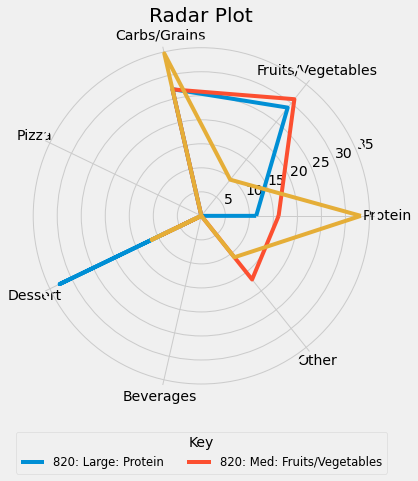

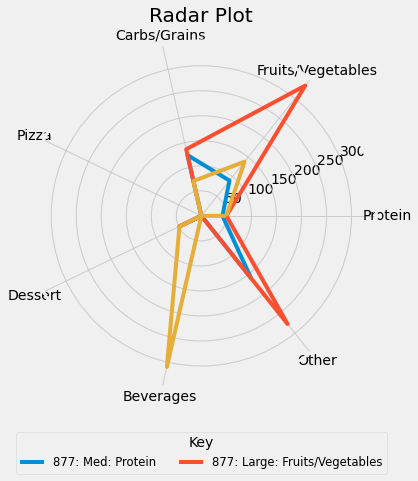

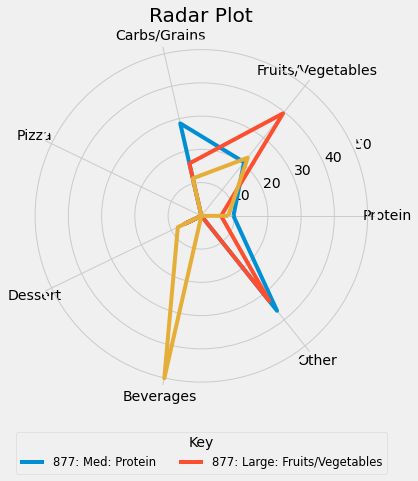

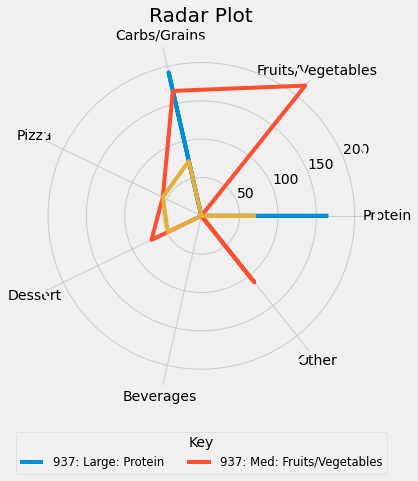

...

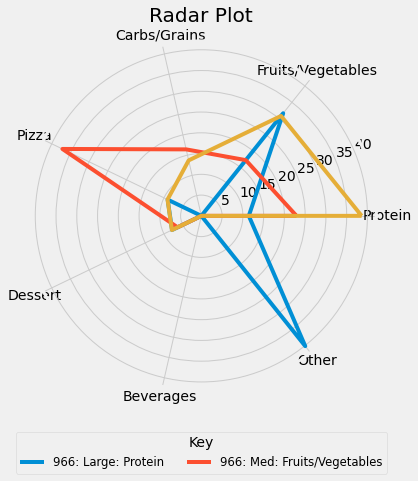

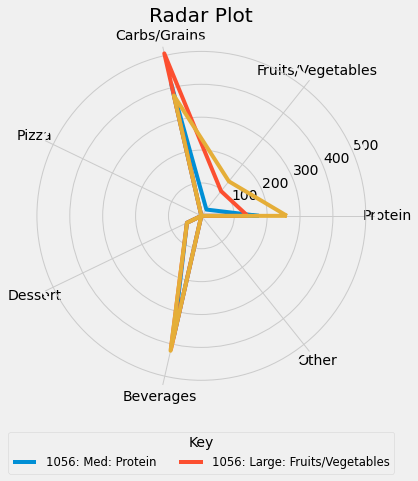

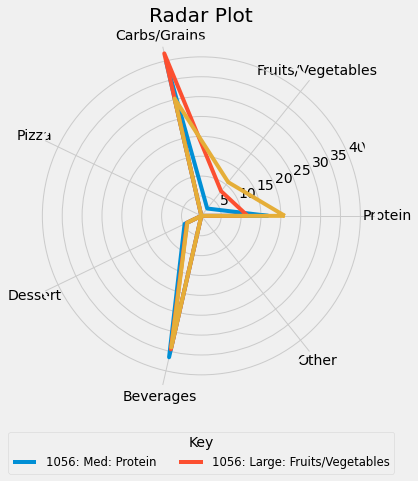

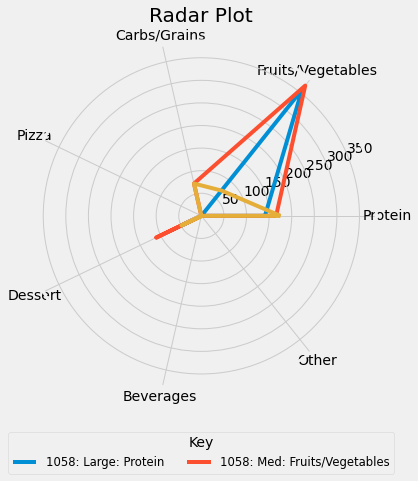

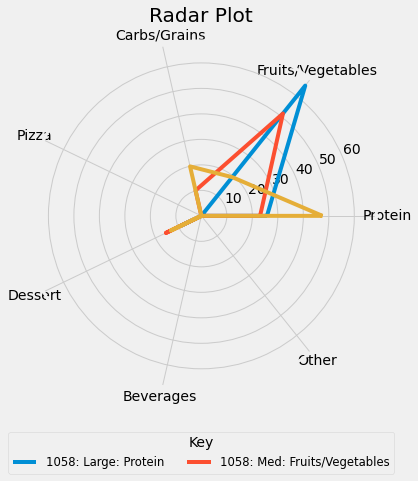

In [79]:
templist1 = []
templist2 = []
participant_list = ['820', '877', '793', '946', '1058', '963', '937', '1056', '942', '966', '961', '984', '962']



for i in range(len(dfs_list)):
    templist1.append(makeSpiderPlot(dfs_list[i]))
    templist2.append(makeSpiderPlotByPercentage(dfs_list[i]))
    
data = {
    'Participant ID': participant_list,
    'Raw plot': templist1,
    '% plot': templist2
}

spiderPlotDF = pd.DataFrame(data)

In [80]:
spiderPlotDF.loc[0]

Participant ID     820
Raw plot          None
% plot            None
Name: 0, dtype: object

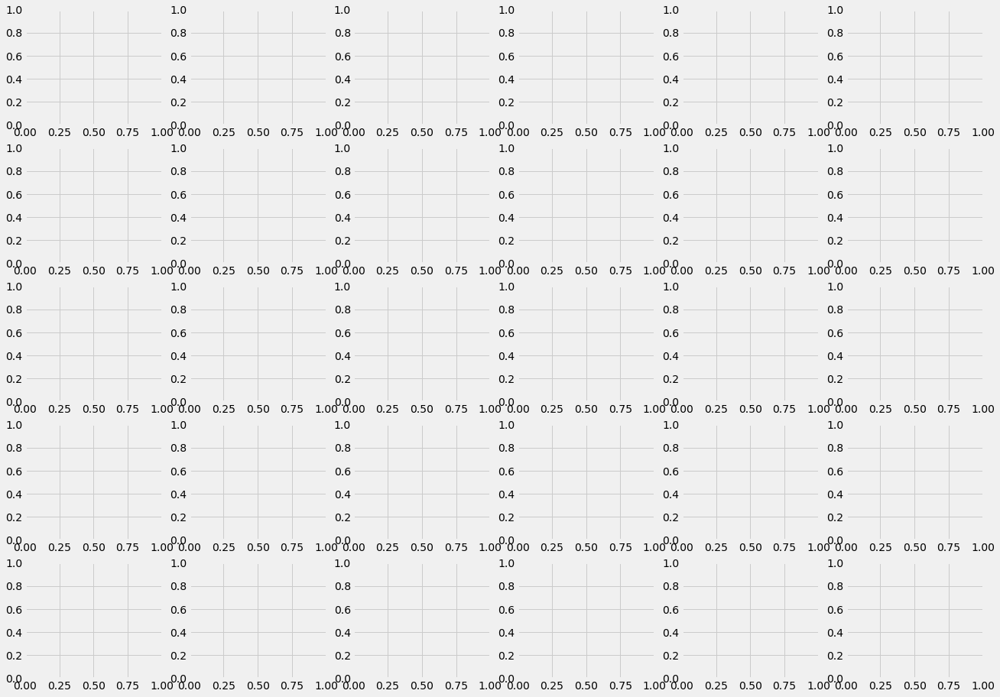

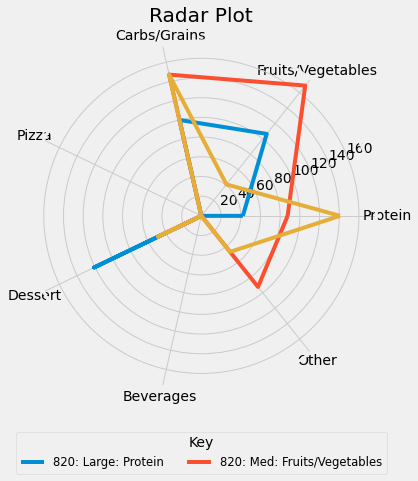

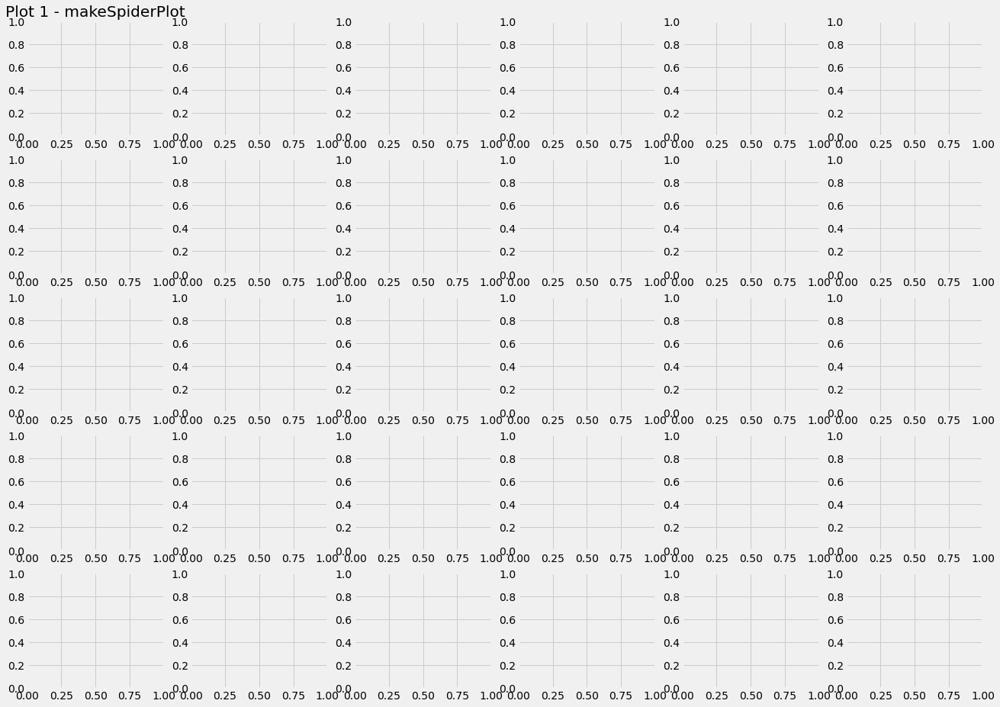

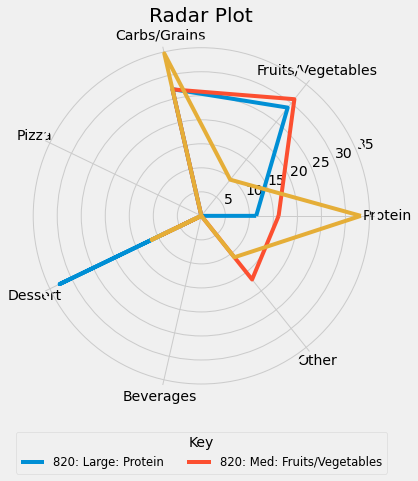

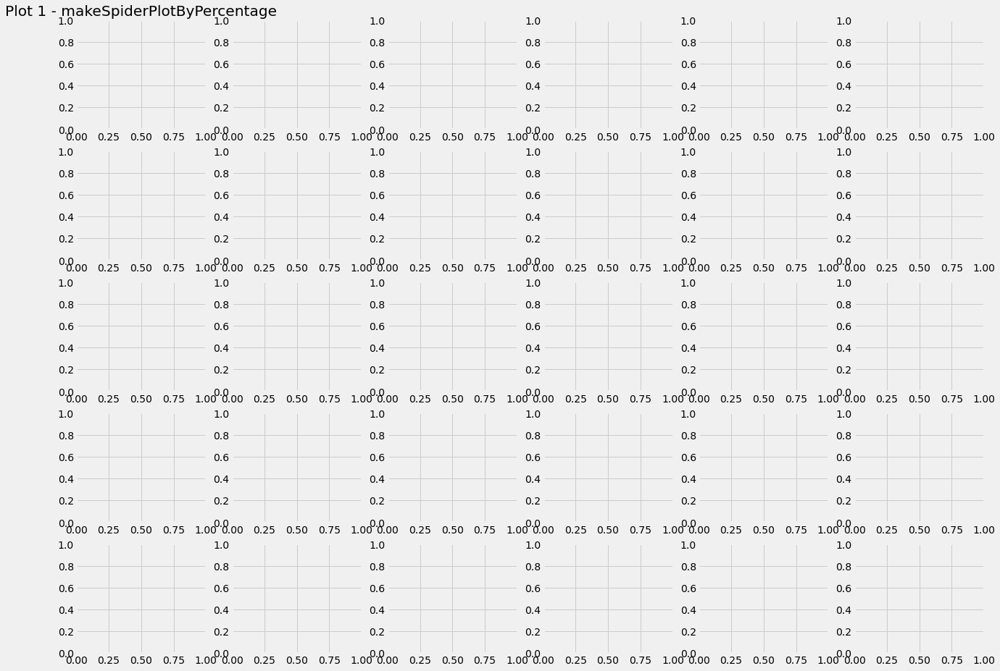

...

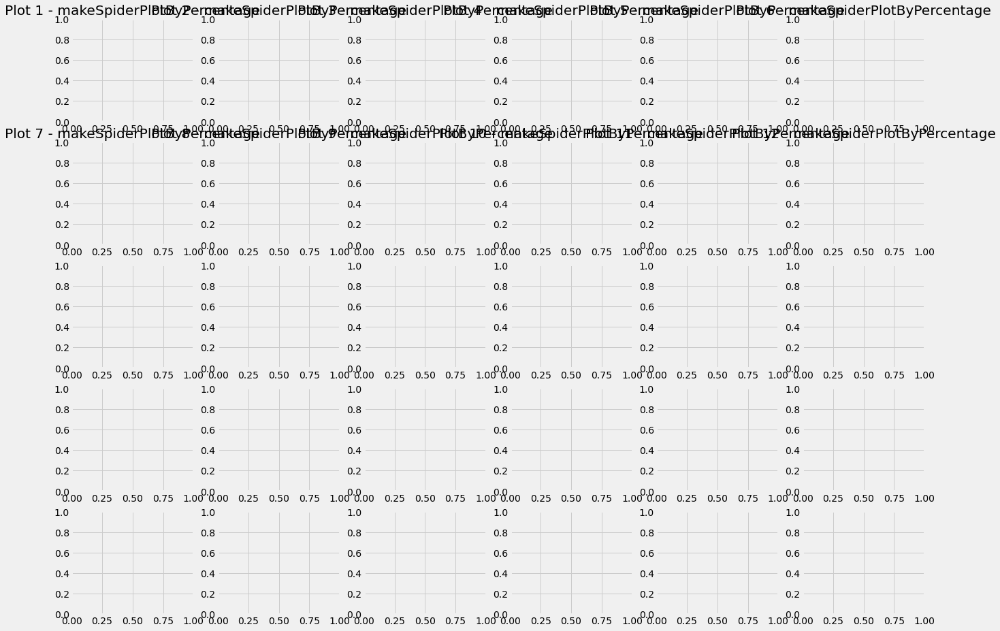

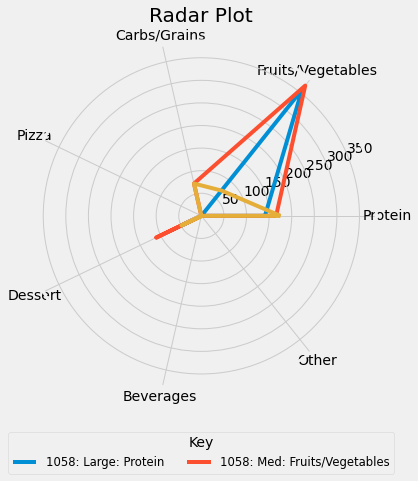

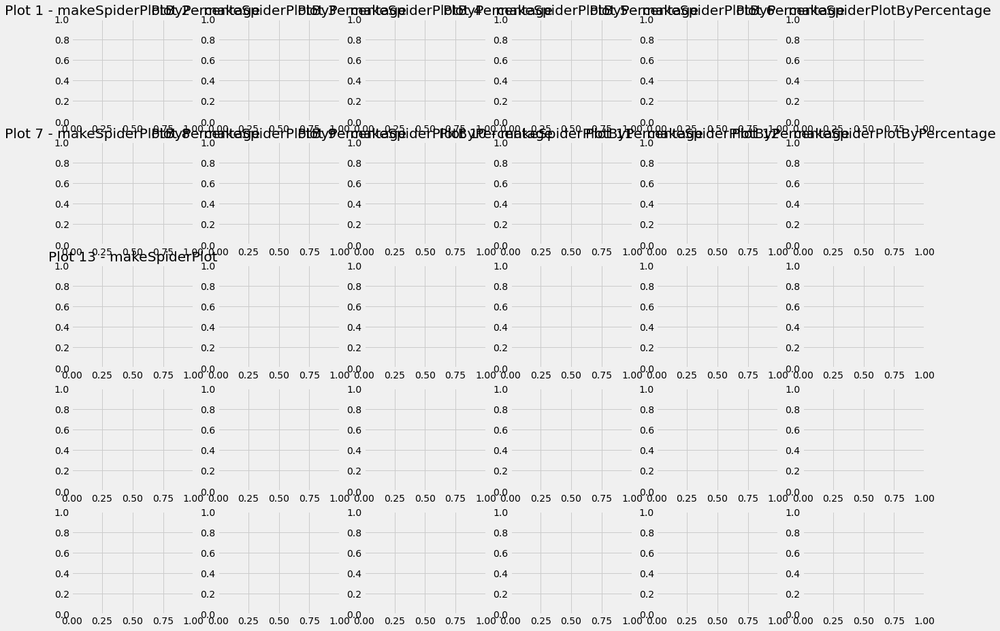

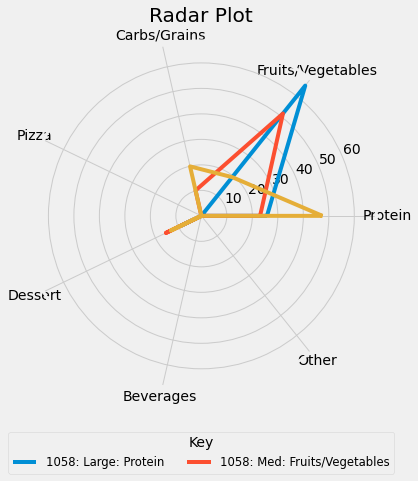

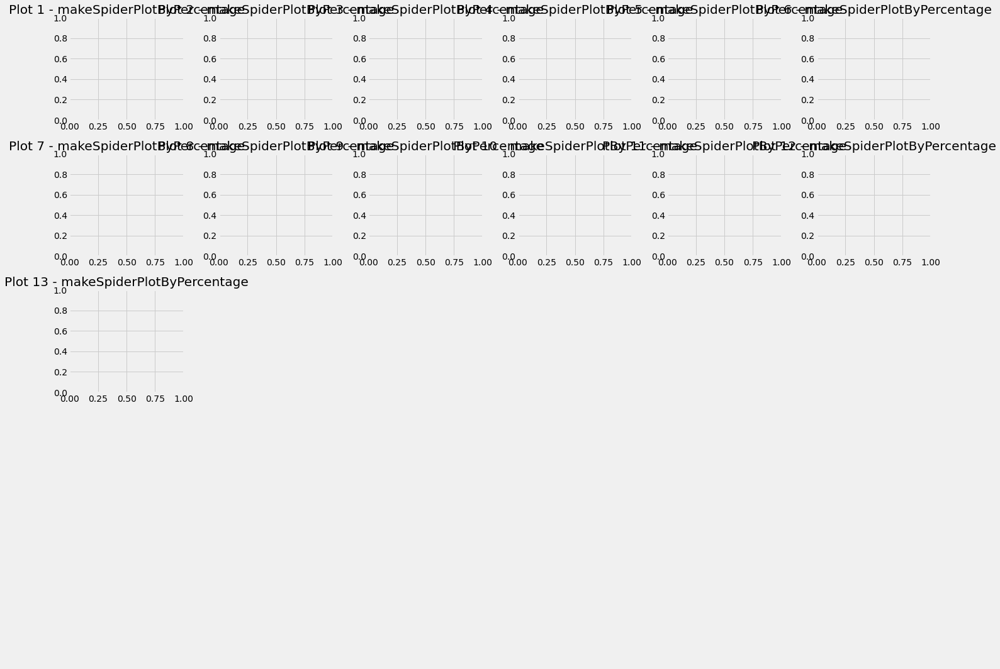

In [81]:
fig, axs = plt.subplots(5, 6, figsize=(20, 15))

axs_flat = axs.flatten()

for i, df in enumerate(dfs_list):
    ax = axs_flat[i]
    makeSpiderPlot(df)
    plt.sca(ax)
    plt.title(f"Plot {i+1} - makeSpiderPlot")

    # Plot the result from function_2 in the second row
    makeSpiderPlotByPercentage(df)
    plt.sca(ax)
    plt.title(f"Plot {i+1} - makeSpiderPlotByPercentage")

# Hide any remaining empty subplots
for ax in axs_flat[len(dfs_list):]:
    ax.axis('off')

# Adjust spacing between subplots
plt.tight_layout()

# Display the multiplot
plt.show()

In [82]:
def perform_cca(dataframe):
    # Assume your dataframe has two sets of variables, X and Y
    # Split the dataframe into two sets of variables
    X = dataframe.iloc[:, :n_features_X].to_numpy()
    Y = dataframe.iloc[:, n_features_X:].to_numpy()

    # Center the data (subtract mean)
    X_centered = X - np.mean(X, axis=0)
    Y_centered = Y - np.mean(Y, axis=0)

    # Calculate the covariance matrices
    cov_matrix_XY = np.cov(X_centered.T, Y_centered.T, bias=True)
    cov_matrix_XX = np.cov(X_centered.T, bias=True)
    cov_matrix_YY = np.cov(Y_centered.T, bias=True)

    # Calculate the square root inverse of covariance matrices
    sqrt_inv_cov_XX = sqrtm(np.linalg.inv(cov_matrix_XX))
    sqrt_inv_cov_YY = sqrtm(np.linalg.inv(cov_matrix_YY))

    # Compute the matrix T for canonical variates in X and Y
    T = np.dot(np.dot(sqrt_inv_cov_XX, cov_matrix_XY), sqrt_inv_cov_YY)

    # Compute the canonical correlations
    _, canonical_correlations, _ = np.linalg.svd(T, full_matrices=False)

    return canonical_correlations

In [83]:
z = perform_cca(calorieDataShreddedCalories)

NameError: name 'n_features_X' is not defined

In [ ]:
def scree_plot_from_dataframe(dataframe):
    # Perform PCA on the dataframe
    pca = PCA()
    principal_components = pca.fit_transform(dataframe)

    # Extract the eigenvalues from the PCA object
    eigenvalues = pca.explained_variance_

    total_variance = np.sum(eigenvalues)
    explained_variance_ratio = eigenvalues / total_variance

    # Create the scree plot
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(eigenvalues) + 1), explained_variance_ratio, marker='o', linestyle='-')
    plt.xlabel('Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Scree Plot')
    plt.xticks(range(1, len(eigenvalues) + 1))
    plt.grid(True)
    plt.show()

In [ ]:
scree_plot_from_dataframe(calorieDataShreddedCategories)

In [ ]:
def local_weighted_linear_regression(dataframe, target_x, tau):
    # Convert the dataframe to numpy arrays
    x_values = dataframe.iloc[:, 0].values
    y_values = dataframe.iloc[:, 1].values
    
    # Add a column of ones to the input features for the bias term in the regression
    X = np.column_stack((np.ones_like(x_values), x_values))
    
    # Calculate the weights using the Gaussian kernel with tau as the bandwidth
    weights = np.exp(-(x_values - target_x)**2 / (2 * tau**2))
    
    # Calculate the weighted X and Y matrices
    weighted_X = np.diag(weights).dot(X)
    weighted_Y = np.diag(weights).dot(y_values)
    
    # Compute the local regression coefficients using weighted least squares
    beta = np.linalg.inv(weighted_X.T.dot(X)).dot(weighted_X.T).dot(weighted_Y)
    
    # Calculate the predicted target value
    target_y = np.array([1, target_x]).dot(beta)
    
    return target_y

In [ ]:
local_weighted_linear_regression(calorieDataShreddedCategories, 1.1,1)

In [ ]:
graphList = []
for i in range(1000):
    graphList.append(local_weighted_linear_regression(calorieDataShreddedCategories, 1.1,1))
    
x_values = range(len(graphList))

# Create the plot
plt.figure(figsize=(8, 6))
plt.plot(x_values, data_list, marker='o', linestyle='-')
plt.xlabel('Index')
plt.ylabel('Data')
plt.title('List Plot')
plt.grid(True)
plt.show()

In [103]:
import pandas as pd
import umap
import matplotlib.pyplot as plt

def plot_umap_embedding(df1, df2, target_column):
    """
    Perform UMAP embedding for two DataFrames and plot the result.

    Parameters:
        df1 (pd.DataFrame): The first DataFrame containing the data for UMAP embedding.
        df2 (pd.DataFrame): The second DataFrame containing the data for UMAP embedding.
        target_column (str): The name of the column in both DataFrames containing phase information.

    Returns:
        None (The function will plot the UMAP embedding directly).
    """
    # Concatenate the two DataFrames vertically
    combined_df = pd.concat([df1, df2], axis=0)

    # Extract the phase information (target_column) from both DataFrames
    phases = combined_df[target_column]

    # Drop the phase column from the combined DataFrame
    combined_df = combined_df.drop(columns=[target_column])

    # Perform UMAP embedding with 2 dimensions (you can change n_components if needed)
    umap_emb = umap.UMAP(n_components=2).fit_transform(combined_df)

    # Split the combined UMAP embedding back into two separate embeddings
    umap_emb_df1 = umap_emb[:len(df1)]
    umap_emb_df2 = umap_emb[len(df1):]

    # Plot the UMAP embeddings
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.scatter(umap_emb_df1[:, 0], umap_emb_df1[:, 1], c=phases[:len(df1)], cmap='tab20')
    plt.title('UMAP Embedding - DataFrame 1')
    plt.colorbar()
#     plt.subplot(1, 2, 2)
#     plt.scatter(umap_emb_df2[:, 0], umap_emb_df2[:, 1], c=phases[len(df1):], cmap='tab20')
#     plt.title('UMAP Embedding - DataFrame 2')
#     plt.colorbar()
    plt.tight_layout()
    plt.show()


In [104]:
ctd = ['prtn', 'phase', 'Highest']
thing = calorieDataShreddedCategories.drop(columns=ctd)
thing

,Participant #,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other
0,820,42.16,106.45,99.87,0.00,120.84,0.0000,0.0000
1,820,87.60,169.20,147.09,0.00,48.57,0.0000,92.3000
2,820,140.80,40.85,147.09,0.00,48.57,0.0000,46.7600
3,877,42.16,90.11,124.60,0.00,20.39,0.0000,159.4700
4,877,50.05,332.96,136.50,0.00,48.57,0.0000,276.3968
5,877,50.05,138.36,71.36,0.00,48.57,309.8013,0.0000
6,937,165.49,0.00,191.75,0.00,0.00,0.0000,0.0000
7,937,0.00,217.33,167.14,55.80,72.27,0.0000,110.5400
8,937,70.84,0.00,73.37,55.80,48.57,0.0000,0.0000
9,793,0.00,96.10,51.75,0.00,0.00,370.2480,227.4386


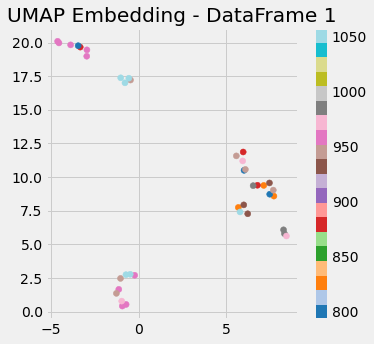

In [105]:
plot_umap_embedding(thing, thing, 'Participant #')

In [102]:
calorieDataShreddedCategories

,Participant #,prtn,phase,Protein,Fruits/Vegetables,Carbs/Grains,Pizza,Dessert,Beverages,Other,Highest
0,820,B,Med,42.16,106.45,99.87,0.00,120.84,0.0000,0.0000,Dessert
1,820,B,Large,87.60,169.20,147.09,0.00,48.57,0.0000,92.3000,Fruits/Vegetables
2,820,D,Med,140.80,40.85,147.09,0.00,48.57,0.0000,46.7600,Carbs/Grains
3,877,B,Med,42.16,90.11,124.60,0.00,20.39,0.0000,159.4700,Other
4,877,B,Large,50.05,332.96,136.50,0.00,48.57,0.0000,276.3968,Fruits/Vegetables
5,877,D,Med,50.05,138.36,71.36,0.00,48.57,309.8013,0.0000,Beverages
6,937,B,Med,165.49,0.00,191.75,0.00,0.00,0.0000,0.0000,Carbs/Grains
7,937,B,Large,0.00,217.33,167.14,55.80,72.27,0.0000,110.5400,Fruits/Vegetables
8,937,D,Med,70.84,0.00,73.37,55.80,48.57,0.0000,0.0000,Carbs/Grains
9,793,B,Med,0.00,96.10,51.75,0.00,0.00,370.2480,227.4386,Beverages
